Set of scripts to compute region-2-region similarity, as well as "neighbor" matrices.  Neighbor matrices map samples in a source region to the most similar samples in a target region, order the target samples from most to least similar.

In [20]:
%matplotlib inline
import matplotlib.pyplot as plt

import numpy as np
from niio import loaded, write

import connectopy
from connectopy import similarity_mapping
from fragmenter import RegionExtractor as re

from scipy.spatial.distance import cdist
import scipy.io as sio

import pandas as pd

In [6]:
def plot_pairwise(sim_features, regions, conn_dir,
                  out_dir, out_base,
                  subject_id, source_id, target_id,
                  max_neighborhood=50, plot=False, plot_neighborhood_sizes=[]):
    
    """
    Method to save and plot scatterplot matrices of source-to-target connectopy mappings.
    
    Parameters:
    - - - - -
    sim_features: float, array
        features to use in order to find most similar samples between source and target regions
        i.e. resting-state time series matrix, streamline connectivity matrix
    regions: dict
        a mapping between region names and region indices
        can be computed using '''fragmenter.RegionExtractor.Extractor'''
    conn_dir: str
        main directory where regional connectopies exist
    out_dir: str
        directory where to save mapped coordinate files as csv
    out_base: str
        'Subject_ID.Hemisphere.'
    subject_id: str
        name of subject to process
    source_id: str
        source region name
    target_id: str
        target region name
    max_neighborhood: int
        largest neighborhood size to compute
    plot: boolean
        whether to generate plots
    plot_neighborhood_sizes: list of ints
        which neighborhood sizes to plot
        largest value must be <= '''max_neighborhood'''
    """
    
    source_indices = regions[source_id]
    target_indices = regions[target_id]

    source_evecs_file = '{:}/{:}/{:}.L.{:}.2.brain.Evecs.func.gii'.format(conn_dir, subject_id, subject_id, source_id)
    source_evecs = loaded.load(source_evecs_file)
    source_features = source_evecs[regions[source_id], :]
    
    s_x = source_features[:, 0]
    s_y = source_features[:, 1]
    
    df = pd.DataFrame({'s_e1': s_x, 's_e2': s_y})
    
    target_evecs_file = '{:}/{:}/{:}.L.{:}.2.brain.Evecs.func.gii'.format(conn_dir, subject_id, subject_id, target_id)
    target_evecs = loaded.load(target_evecs_file)
    target_features = target_evecs[regions[target_id], :]
    
    source_samples = sim_features[source_indices, :]
    target_samples = sim_features[target_indices, :]

    neighbors = similarity_mapping.cross_similarity(source_samples, 
                                                target_samples, 
                                                k=max_neighborhood, metric='correlation')
    
    neighbor_coords = {}.fromkeys(plot_neighborhood_sizes)
    for n in plot_neighborhood_sizes:
        
        neighbor_coords[n] = {'e1': None, 'e2': None}
        
        print('Neighborhood size: {:}'.format(n))
        
        centroids = similarity_mapping.cross_mapping(target_features, neighbors[:, 0:n])
        neighbor_coords[n]['e1'] = centroids[:, 0]
        neighbor_coords[n]['e2'] = centroids[:, 1]
        
        df = df.merge(pd.DataFrame({'t{:}_{:}'.format(n, eigen): neighbor_coords[n][eigen] for eigen in neighbor_coords[n].keys()}),
                     left_index=True, right_index=True)
        
        columns = ['s_e1', 's_e2'] + ['t{:}_{:}'.format(n, s) for s in ['e1', 'e2']]
        temp = df[columns]
        temp = temp.sort_values(by=['s_e1'])
        colors = np.arange(1, len(s_x)+1)
        
        if plot:
        
            A = pd.plotting.scatter_matrix(temp, diagonal='hist', c=colors, figsize=(15, 15), marker='.', alpha=0.5,
                                      hist_kwds=dict(alpha=0.5, density=True));

            for ax in A.ravel():
                ax.set_xlabel(ax.get_xlabel(), fontsize = 15)
                ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1])
                ax.set_xticklabels(labels=[0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=12)

                ax.set_ylabel(ax.get_ylabel(), fontsize = 15)
                ax.set_yticklabels(labels=[0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=12)
                plt.tight_layout()

            plt.yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1])
            plt.show()
        
    out_csv = '{:}/{:}.{:}.2.{:}.csv'.format(out_dir, 
                                             out_base,
                                             source_id, 
                                             target_id)
    df.to_csv(out_csv, header=True, index=False)
    
    N = {'neighbors': target_indices[neighbors].squeeze()}
    out_neighbors = '{:}/{:}.{:}.2.{:}.Neighbors.mat'.format(out_dir, 
                                                             out_base,
                                                             source_id,
                                                             target_id)
    sio.savemat(file_name=out_neighbors, mdict=N, appendmat=False)
    
    return df

In [10]:
def mapping_counts(neighborhood):
    
    """
    Compute the number of times a given target vertex is mapped to by all source vertices, 
    as a function of neighborhood size.
    
    Parameters:
    - - - - -
    source_id: str
        source region ID
    target_id: str
        target region ID
    neighborhood: int, array
        neighborhood matrix -- i.e. mapping from source region to target region
        Each row is source vertex.  Each column is a target vertex.  Column order
        is from most similar to least similar to source vertex.
    roi_map: dict
        mapping from region names to indices in mesh
    """
    
    z = np.zeros((32492, neighborhood.shape[1]))
    
    y = np.zeros((32492,))
    for i in np.arange(neighborhood.shape[1]):
        
        for j in neighborhood[:, i]:
            y[j] += 1
        
        z[:,i] = y
    
    return z

In [22]:
import numpy as np
from scipy import sparse
import networkx as nx

def weightedadjacency(V, F):
    
    """
    Compute Euclidean distance matrix of all pairs of directly adjacency vertices in a surface mesh.
    
    Parameters:
    - - - - -
    V: float, array
        vertex coordinates
    F: int, array
        list of triangles in mesh
        
    Returns:
    - - - -
    W: float, array
        pairwise Euclidean distance matrix
    """

    n,p = V.shape

    weights = np.sqrt(np.concatenate([((V[F[:, 0], :] - V[F[:, 1], :])**2).sum(1),
                                     ((V[F[:, 0], :] - V[F[:, 2], :])**2).sum(1),
                                     ((V[F[:, 1], :] - V[F[:, 0], :])**2).sum(1),
                                     ((V[F[:, 1], :] - V[F[:, 2], :])**2).sum(1),
                                     ((V[F[:, 2], :] - V[F[:, 0], :])**2).sum(1),
                                     ((V[F[:, 2], :] - V[F[:, 1], :])**2).sum(1),]))

    eps = 1e-6

    rows = np.concatenate([F[:, 0], F[:, 0],
                         F[:, 1], F[:, 1],
                         F[:, 2], F[:, 2]])
    cols = np.concatenate([F[:, 1], F[:, 2],
                          F[:, 0], F[:, 2],
                          F[:, 0], F[:, 1]])

    combos = np.column_stack([rows, cols])
    [rc, idx] = np.unique(combos, axis=0, return_index=True)
    weights = weights[idx]

    W = sparse.csr_matrix((weights, (rc[:, 0], rc[:, 1])), shape=(n, n))
    W = (W + W.transpose())/2

    return W

def adjacency_2_nx(adjacency, inds):
    
    """
    Convert adjacency to networkx graph.
    
    Parameters:
    - - - - -
    adjacency: float, array
        adjacency matrix of whole-brain surface mesh
        Indices between neighboring pairs of vertices contain Euclidean distance,
        rather than 1 or 0.
    inds: int, list
        list of indices to compute networkx graph from
        
    Returns:
    - - - -
    g: networkx Graph
    
    """
    
    adjacency = adjacency[inds, :][:, inds]
    
    g = nx.from_scipy_sparse_matrix(adjacency)
    
    return g

def intraregional_distance(nx_graph):
    
    """
    Compute intraregional pairwise Euclidean distance matrix.
    
    Parameters:
    - - - - -
    nx_graph: nx.Graph
        Networkx graph object for adjacency matrix of single region.
        Indices between neighboring pairs of vertices contain Euclidean distance,
        rather than 1 or 0.
    
    Returns:
    - - - -
    apsp: float, array
        all-pairs shortest path length matrix
    """
    
    apsp = nx.floyd_warshall_numpy(nx_graph, weight='weight')
    
    return apsp

def knearest_distance(d, inds, ioi):
    
    """
    Compute the mean distance between all pairs of indices in a list.
    
    Parameters:
    - - - - -
    d: float, array
        
        All-pairs shortest path length matrix.
        In this case, used for intra-regional distnces.
        
    inds: dictionary
    
        A mapping from ROI indices to 0 : d.shape[1]
        
        Usage example:
            
            # initialize region extractor
            R = RegionExtractor.Extractor(label_file)
            
            # get indices for each region in map
            regions = R.map_regions()
            
            # get indices for precentral gyrus
            inds = region['precentral']
            
            # create mapping from indices to order
            D = dict(zip(inds, np.arange(len(inds))))
             
    ioi: int, list
        
        List of indices (index from 0 : d.shape[1]) for
        which to compute mean distance between, in the
        original index coordinates, not in the remapped
        coordiantes.
    
    """
    
    remapped = []
    for i in ioi:
        remapped.append(inds[i])
    
    d = d[remapped, :][:, remapped]
    distances = d[np.triu_indices(d.shape[0], k=1)]
    
    return distances.mean()
    
def knearest_crosscorr(d, k):
    
    """
    Compute the mean cross-correlation between source vertex and k-most similar neighbors.
    
    Parameters:
    - - - - -
    d: float, array
        cross-correlation matrix between source and target regions
    k: int
        k-nearest neighbors
    """
    
    dsort = -1*np.sort(-1*d, axis=1)
    
    dmeans = np.zeros((d.shape[0], k))
    dmedians = np.zeros((d.shape[0], k))
    for i in np.arange(k):
        dmeans[:, i] = dsort[:, 0:(i+1)].mean(1).squeeze()
        dmedians[:, i] = np.median(dsort[:, 0:(i+1)], axis=1).squeeze()
    
    return [dmeans, dmedians]appendmat=

In [ ]:
subjects = ['289555', '290136', '293748', '298051', '298051']

Define the subject ID and data directory.

In [36]:
data_dir = '/Users/kristianeschenburg/Desktop/Research/Data'
conn_dir = '/Users/kristianeschenburg/Desktop/Connectopies/'
hemisphere = 'L'

hemi_map = {'L': 'LEFT',
                'R': 'RIGHT'}

cortex_map = {'L': 'CortexLeft',
              'R': 'CortexRight'}

ISIZE=50

In [1]:
for subject in subjects:

    
    #####
    #####
    """
    Load the resting-state data (or other set of features)
    """
    print('Loading resting-state data.')
    rest_file = '{:}/RestingState/{:}.rfMRI_Z-Trans_merged_CORTEX_{:}.mat'.format(data_dir, subject, hemi_map[hemisphere])
    rest = loaded.load(rest_file)

    if rest.shape[0] < rest.shape[1]:
        rest = rest.T

    print('Subject: {:}'.format(subject))
    print('Hemisphere: {:}'.format(hemisphere))
    print(rest.shape)
    
    
    #####
    #####
    """
    Load the label file and extract region indices
    """
    print('Extracting region indices.')
    label_file = '{:}/Labels/Desikan/{:}.{:}.aparc.32k_fs_LR.label.gii'.format(data_dir, subject, hemisphere)
    R = re.Extractor(label_file)
    regions = R.map_regions()

    #####
    #####
    """
    For each region in Desikan atlas, define it as source region.  
    Loop over all remaining regions in Desikan atlas and define 
    these are target regions.  Compute mapping from source to target, 
    for all source-target pairs.
    """
    print('Computing source-to-target mappings.')
    for j, source_region in enumerate(list(regions.keys())):
        if source_region not in ['corpuscallosum']:
            
            for target_region in regions.keys():
                if target_region not in 'corpuscallosum':
                    
                    D = plot_pairwise(rest, regions, 
                    conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                    out_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan/{:}'.format(subject),
                    out_base='{:}.{:}'.format(subject, hemisphere),
                    subject_id=subject, 
                    source_id=source_region, 
                    target_id=target_region)
    
    
    #####
    #####
    """
    For a given mapping, we are interested in seeing to which target 
    vertices, the vertices in the source region map to most strongly 
    and/or frequently.  For each neighborhood size, we compute the 
    number of times that a given target vertex is mapped to, by any 
    source vertex, and divide this count by the total number of source 
    vertices to compute a "mean" mapping count.
    """
    print('Processing inter-regional mapping count data.')
    for source_region in regions.keys():
        
        z = np.zeros((32492, 50))
        if source_region != 'corpuscallosum':
            
            for target_region in regions.keys():
                
                if target_region != 'corpuscallosum':
                    
                    neighbor_file = '{:}Desikan/{:}/{:}.{:}.{:}.2.{:}.Neighbors.mat'.format(conn_dir,
                                                                                            subject,
                                                                                            subject,
                                                                                            hemisphere,
                                                                                            source_region,
                                                                                            target_region)

                    neighbors = loaded.load(neighbor_file)
                    t = mapping_counts(neighbors)

                    n,p = t.shape
                    z[:,:p] += t

            write.save(z, '{:}NeighborCounts/RestingState/{:}.{:}.{:}.2.Brain.Counts.func.gii'.format(conn_dir,
                                                                                    subject,
                                                                                    hemisphere,
                                                                                    source_region), cortex_map[hemisphere])
            
    #####
    #####
    """
    For a given mapping, we are interested in seeing to which target 
    vertices, the vertices in the source region map to most strongly 
    and/or frequently.  For each neighborhood size, we compute the mean
    and median correlation of the top K most correlated vertices in the
    target region, for each vertex in the source region.
    """
    print('Processing inter-regional ordered correlation data.')
    for j, source_region in enumerate(list(regions.keys())[:-1]):
        if source_region != 'corpuscallosum':

            for i, target_region in enumerate(list(regions.keys())[j:]):

                if target_region != 'corpuscallosum':

                    source_inds = regions[source_region]
                    target_inds = regions[target_region]

                    source_data = rest[source_inds, :]
                    target_data = rest[target_inds, :]

                    pairwise = 1-cdist(source_data, target_data, metric='correlation')
                    [tmu, tmed] = knearest_crosscorr(pairwise, 50)
                    z = np.zeros((32492, 50))
                    z[source_inds, :] = tmu

                    write.save(z, '{:}NeighborFunctional/{:}/{:}.{:}.{:}.2.{:}.mean_knn.func.gii'.format(conn_dir,
                                                                                                         subject,
                                                                                                         subject,
                                                                                                         hemisphere,
                                                                                                         source_region,
                                                                                                         target_region), 
                               cortex_map[hemisphere])

                    [tmu, tmed] = knearest_crosscorr(pairwise.T, 50)
                    z = np.zeros((32492, 50))
                    z[target_inds, :] = tmu

                    write.save(z, '{:}NeighborFunctional/{:}/{:}.{:}.{:}.2.{:}.mean_knn.func.gii'.format(conn_dir,
                                                                                                         subject,
                                                                                                         subject,
                                                                                                         hemisphere,
                                                                                                         target_region,
                                                                                                         source_region), 
                               cortex_map[hemisphere])
                    
    print('Aggregating inter-regional ordered correlated data.')
    for target_region in regions.keys():
        if target_region != 'corpuscallosum':
            target_inds = regions[target_region]

            z = np.zeros((32492, 50))
            for source_region in regions.keys():
                if source_region != 'corpuscallosum':
                    source_inds = regions[source_region]

                    knn_file = '{:}NeighborFunctional/{:}/{:}.{:}.{:}.2.{:}.mean_knn.func.gii'.format(conn_dir,
                                                                                                      subject,
                                                                                                      subject,
                                                                                                      hemisphere,
                                                                                                      source_region,
                                                                                                      target_region)
                    knn = loaded.load(knn_file)
                    z += knn

            z[rinds, :] = np.nan
            write.save(z, '{:}NeighborFunctional/{:}/{:}.{:}.knn_mean.2.{:}.func.gii'.format(conn_dir,
                                                                                             subject,
                                                                                             subject,
                                                                                             hemisphere, 
                                                                                             target_region), 
                       cortex_map[hemisphere])
                    
                    
    #####
    #####

    """
    Compute regional distance matrices.
    """
    print('Computing / saving regional distance matrices.')
    """
    Load surface file and extract vertices and triangles of mesh
    """
    print('Loading midthickness surface.')
    midthick_surface_file = '{:}/Surfaces/{:}.{:}.midthickness.32k_fs_LR.acpc_dc.surf.gii'.format(data_dir, subject, hemisphere)
    [vertices, faces] = loaded.loadSurf(midthick_surface_file)
    sadj = weightedadjacency(V = vertices, F = faces)
    for j, source_region in enumerate(regions.keys()):
        
        out_dist = '{:}/RegionalDistances/{:}/{:}.{:}.{:}.DistanceMap'.format(data_dir, 
                                                                              subject, 
                                                                              subject, 
                                                                              hemisphere, 
                                                                              source_region)
        
        rinds = regions[source_region]
        g = adjacency_2_nx(sadj, rinds)
        sps = intraregional_distance(g)
        sps = {'dist': sps}
        
        sio.savemat(file_name=out_dist, mdict=sps)
        
        
    #####
    #####
    """
    For a given mapping, we are interested in seeing how spread out the
    top K nearest neighbors in the target region are, for a given source
    vertex.  Here, we compute the neighborhood size as a function of 
    number of neighbors.
    """
    print('Processing source-to-target neighborhood size.')
    for j, target_region in enumerate(list(regions.keys())):
        if target_region != 'corpuscallosum':

            tinds = regions[target_region]
            tmaps = dict(zip(tinds, np.arange(len(tinds))))

            dist_file = '{:}/RegionalDistances/{:}/{:}.{:}.{:}.DistanceMap.mat'.format(data_dir, 
                                                                                          subject, 
                                                                                          subject, 
                                                                                          hemisphere, 
                                                                                          target_region)
            dmat = loaded.load(dist_file)

            z = np.zeros((32492, ISIZE))
            for i, source_region in enumerate(list(regions.keys())):
                if source_region != 'corpuscallosum':
                    sinds = regions[source_region]

                    neighbor_file = '{:}NeighborMappings/{:}/{:}.{:}.{:}.2.{:}.Neighbors.mat'.format(conn_dir,
                                                                                            subject,
                                                                                            subject, 
                                                                                            hemisphere, 
                                                                                            source_region, 
                                                                                            target_region)
                    neighbors = loaded.load(neighbor_file)
                    n, p = neighbors.shape
                    for j in np.arange(n):
                        for k in np.arange(p):
                            z[sinds[j], k] = knearest_distance(dmat, tmaps, neighbors[j, 0:(k+1)])
                            
            out_func = '{:}NeighborDistances/{:}/{:}.{:}.Distance.2.{:}.func.gii'.format(conn_dir, 
                                                                                          subject, 
                                                                                          subject, 
                                                                                          hemisphere, target_region)
            write.save(z, out_func, cortex_map[hemisphere])
    

In [112]:
midthick_surface_file = '{:}/Surfaces/{:}.{:}.midthickness.32k_fs_LR.acpc_dc.surf.gii'.format(data_dir, subject, hemisphere)
[vertices, faces] = loaded.loadSurf(midthick_surface_file)
sadj = weightedadjacency(V = vertices, F = faces)
for j, source_region in enumerate(regions.keys()):

    out_dist = '{:}/RegionalDistances/{:}/{:}.{:}.{:}.DistanceMap'.format(data_dir, 
                                                                          subject, 
                                                                          subject, 
                                                                          hemisphere, 
                                                                          source_region)

    rinds = regions[source_region]
    g = adjacency_2_nx(sadj, rinds)
    sps = intraregional_distance(g)
    sps = {'dist': sps}

    sio.savemat(file_name=out_dist, mdict=sps)

In [ ]:
print('Processing source-to-target neighborhood size.')
for j, tr in enumerate(list(regions.keys())):
    if tr != 'corpuscallosum':

        tinds = regions[tr]
        tmaps = dict(zip(tinds, np.arange(len(tinds))))

        dist_file = '{:}/RegionalDistances/{:}/{:}.{:}.{:}.DistanceMap.mat'.format(data_dir, 
                                                                                      subject, 
                                                                                      subject, 
                                                                                      hemisphere, 
                                                                                      tr)
        dmat = loaded.load(dist_file)

        z = np.zeros((32492, ISIZE))
        for i, sr in enumerate(list(regions.keys())):
            if sr != 'corpuscallosum':
                sinds = regions[sr]

                neighbor_file = '{:}NeighborMappings/{:}/{:}.{:}.{:}.2.{:}.Neighbors.mat'.format(conn_dir,
                                                                                        subject,
                                                                                        subject, 
                                                                                        hemisphere, 
                                                                                        sr, 
                                                                                        tr)
                neighbors = loaded.load(neighbor_file)
                n, p = neighbors.shape
                for j in np.arange(n):
                    for k in np.arange(p):
                        z[sinds[j], k] = knearest_distance(dmat, tmaps, neighbors[j, 0:(k+1)])
                        
        out_func = '{:}NeighborDistances/{:}/{:}.{:}.Distance.2.{:}.func.gii'.format(conn_dir,
                                                                                     subject,
                                                                                     subject,
                                                                                     hemisphere, tr)
        write.save(z, out_func, cortex_map[hemisphere])

Processing source-to-target neighborhood size.


/Users/kristianeschenburg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:120: RuntimeWarning: Mean of empty slice.
/Users/kristianeschenburg/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [289]:
import seaborn as sns
sns.set(style="ticks")

In [469]:
import matplotlib.pyplot as plt

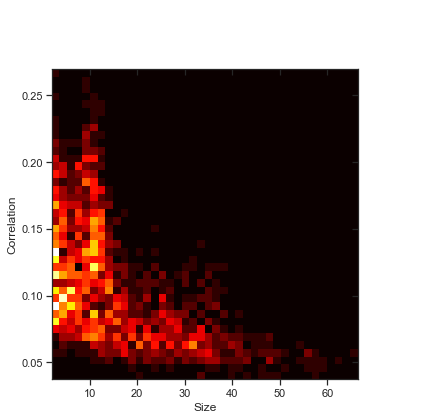

In [492]:
g = sns.JointGrid(x='Size', y='Correlation', data=df, space=0)
g.plot_joint(plt.hist2d, bins=40, cmap='hot')

In [522]:
import plotnine
from plotnine import ggplot, geom_point, geom_density_2d, aes

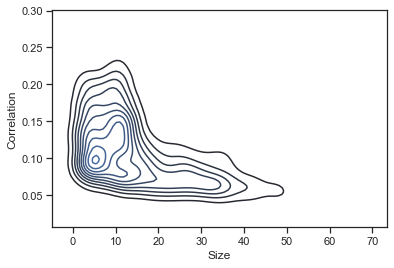

In [505]:
sns.kdeplot(data=df['Size'], data2=df['Correlation'])

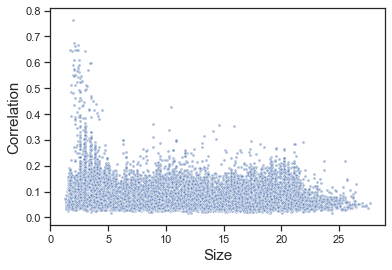

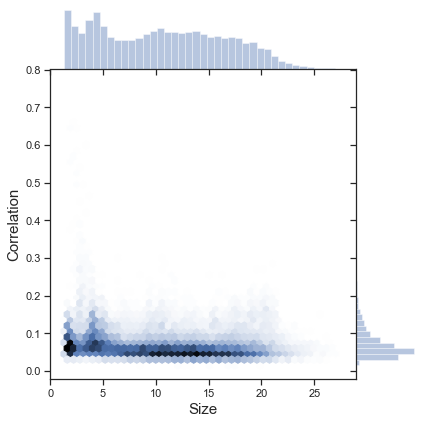

In [393]:
reg = 'bankssts'

in_knn = '/Users/kristianeschenburg/Desktop/285345.L.knn_mean.2.{:}.func.gii'.format(reg)
knn = loaded.load(in_knn)

in_dist = '/Users/kristianeschenburg/Desktop/Connectopies/NeighborDistances/L.Map.2.{:}.func.gii'.format(reg)
dist = loaded.load(in_dist)

x = dist[:, 5]
y = knn[:, 5]

inds = np.arange(32492)[~np.isnan(y)]
inds = inds[y[inds] != 0]

x = x[inds]
y = y[inds]

df = pd.DataFrame({'Size': x, 'Correlation': y})

h = sns.scatterplot(data=df, x='Size', y='Correlation', alpha=0.5, marker='.')
h.set_xlabel('Size', fontsize=15)
h.set_ylabel('Correlation', fontsize=15)

g = sns.jointplot(data=df, x='Size', y='Correlation', kind='hex', space=0,)
g.set_axis_labels(xlabel='Size', ylabel='Correlation', fontsize=15)


### Source: Precentral, Target: Inferiorparietal

Souce shape: (1977, 4800)
Target shape: (1817, 4800)
Neighborhood size: 1


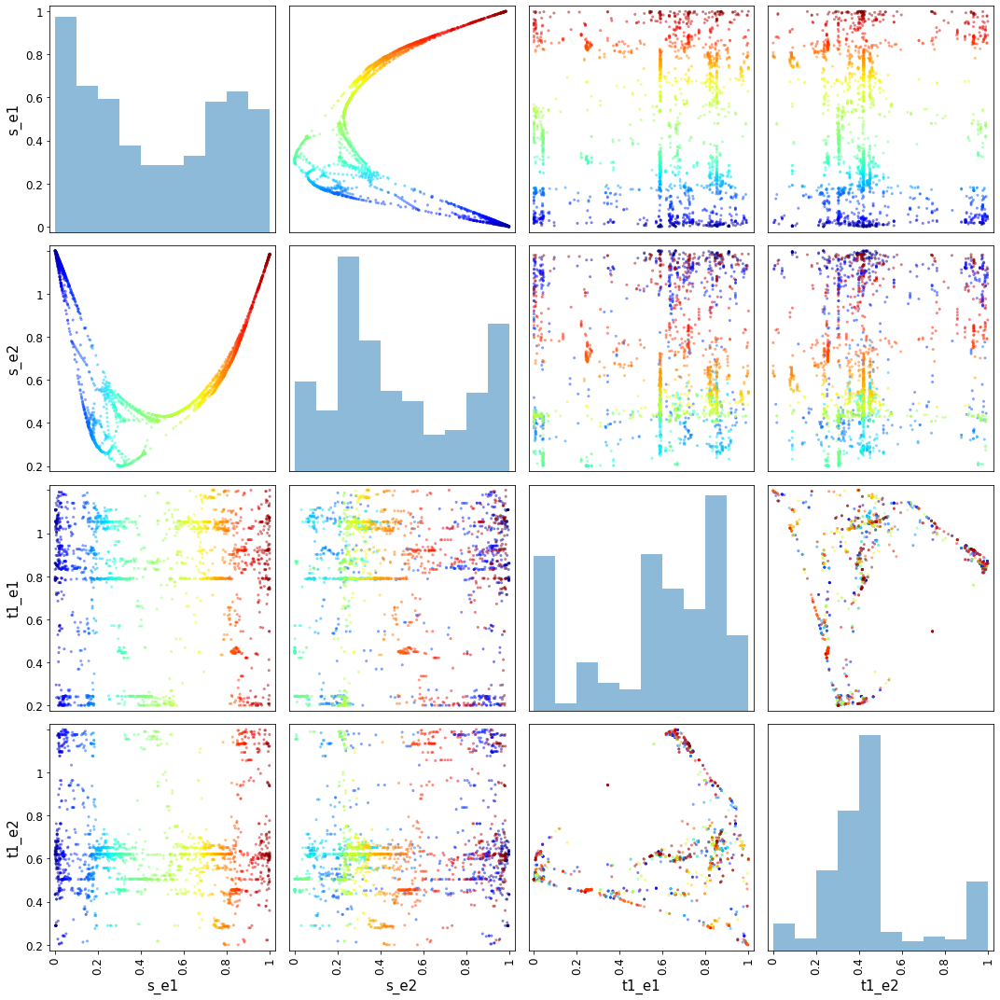

Neighborhood size: 5


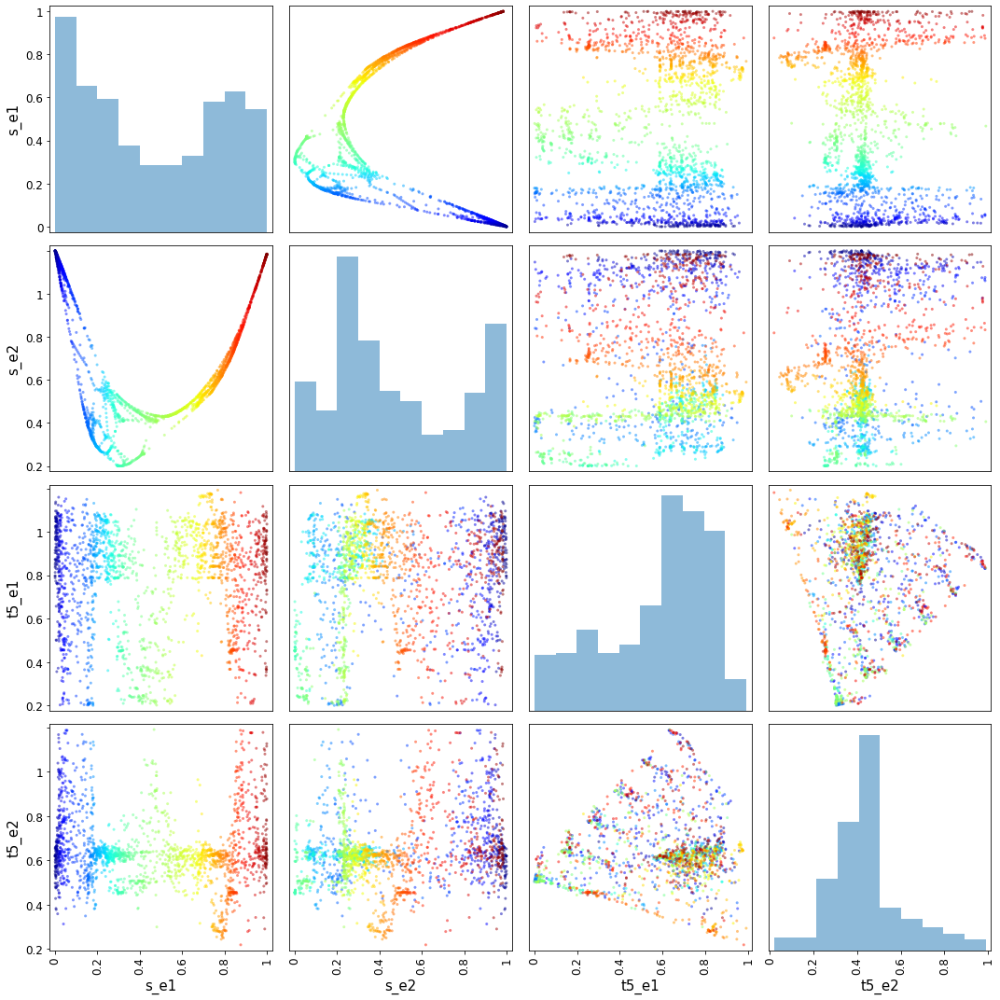

Neighborhood size: 10


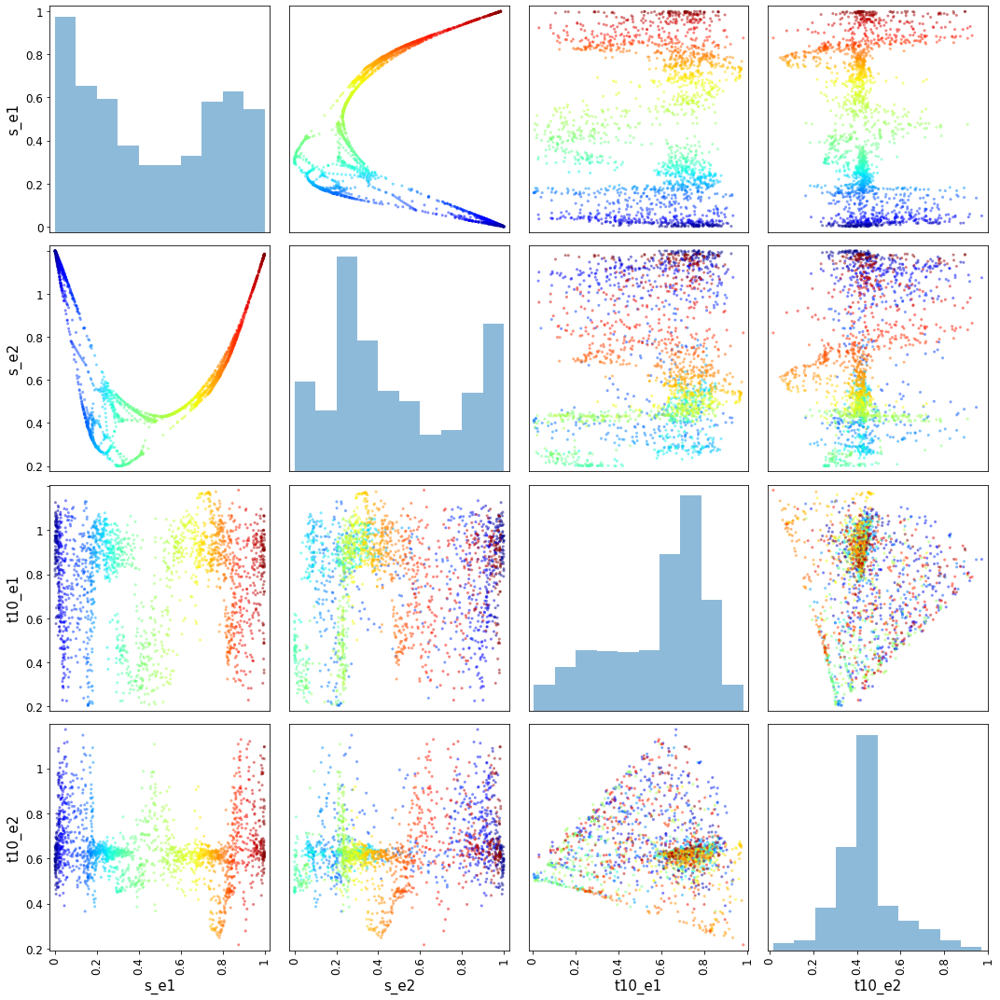

In [586]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='precentral', x
                  target_id='inferiorparietal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Inferiorparietal, Target: Precentral

Souce shape: (1817, 4800)
Target shape: (1977, 4800)
Neighborhood size: 1


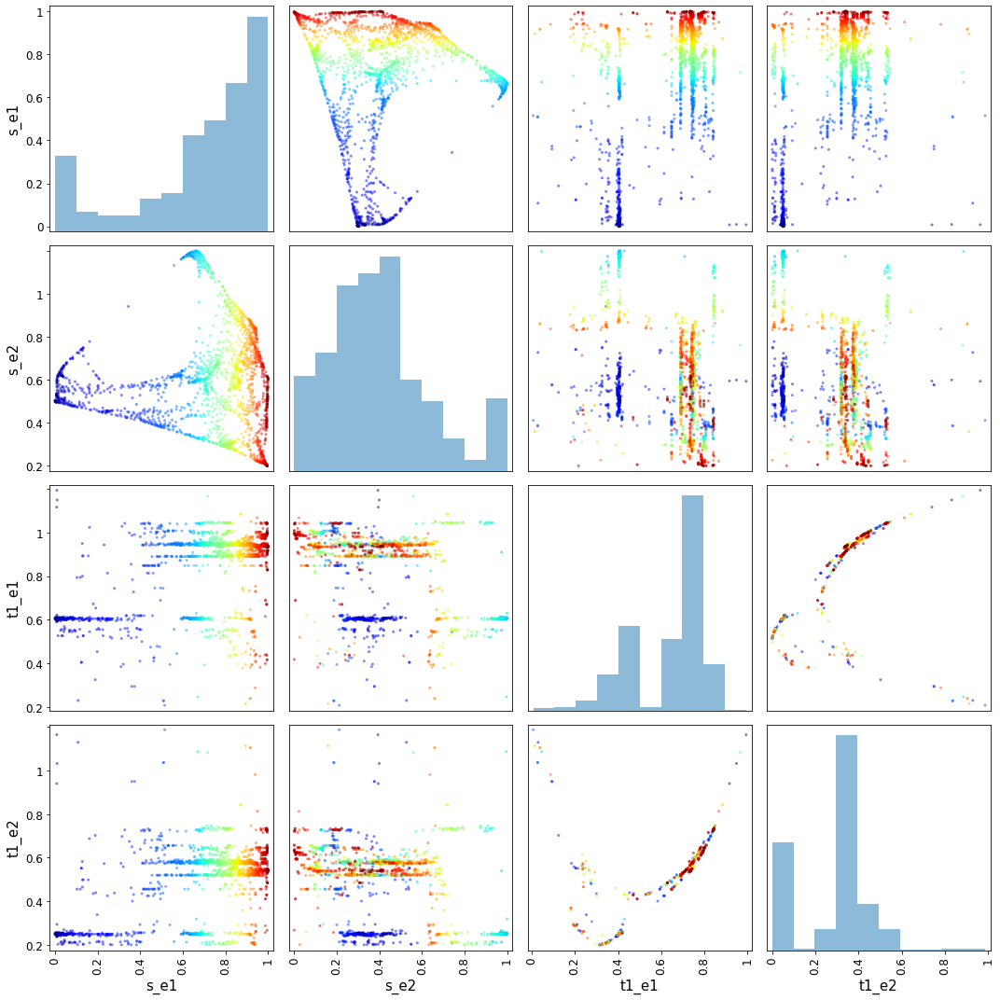

Neighborhood size: 5


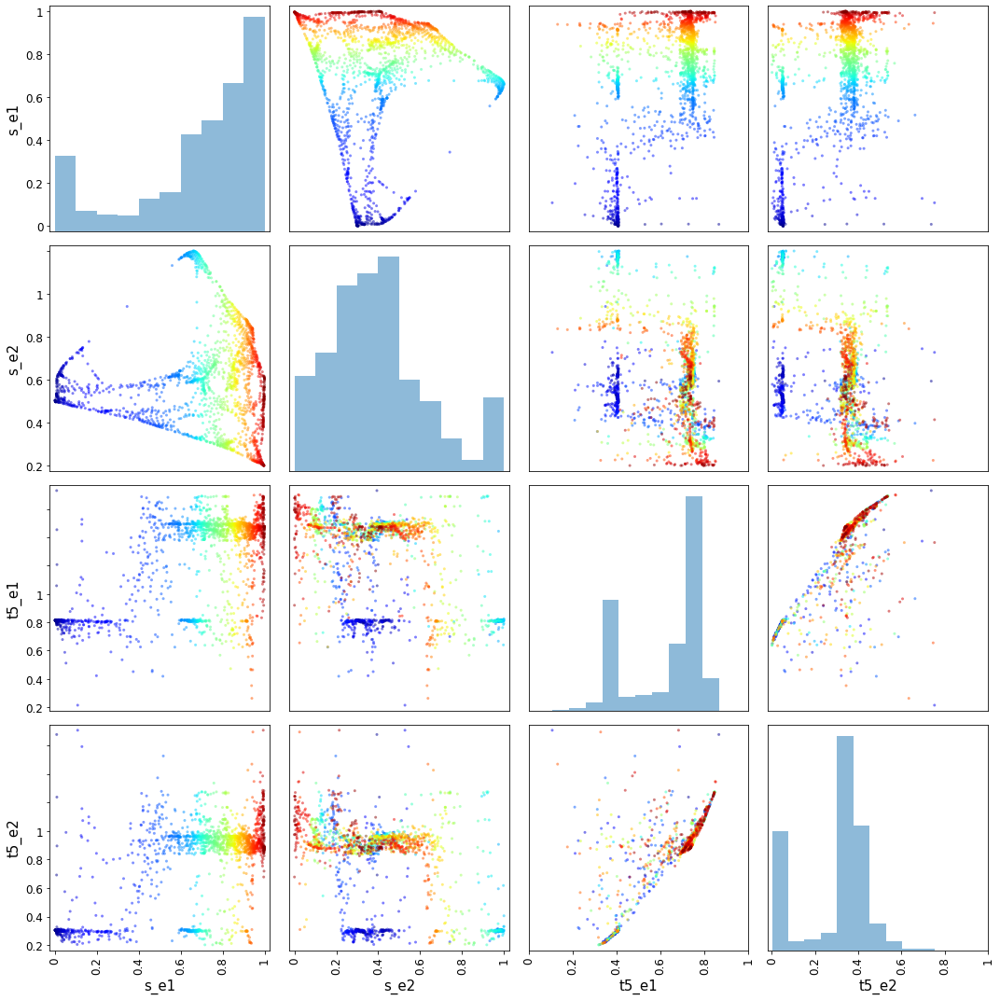

Neighborhood size: 10


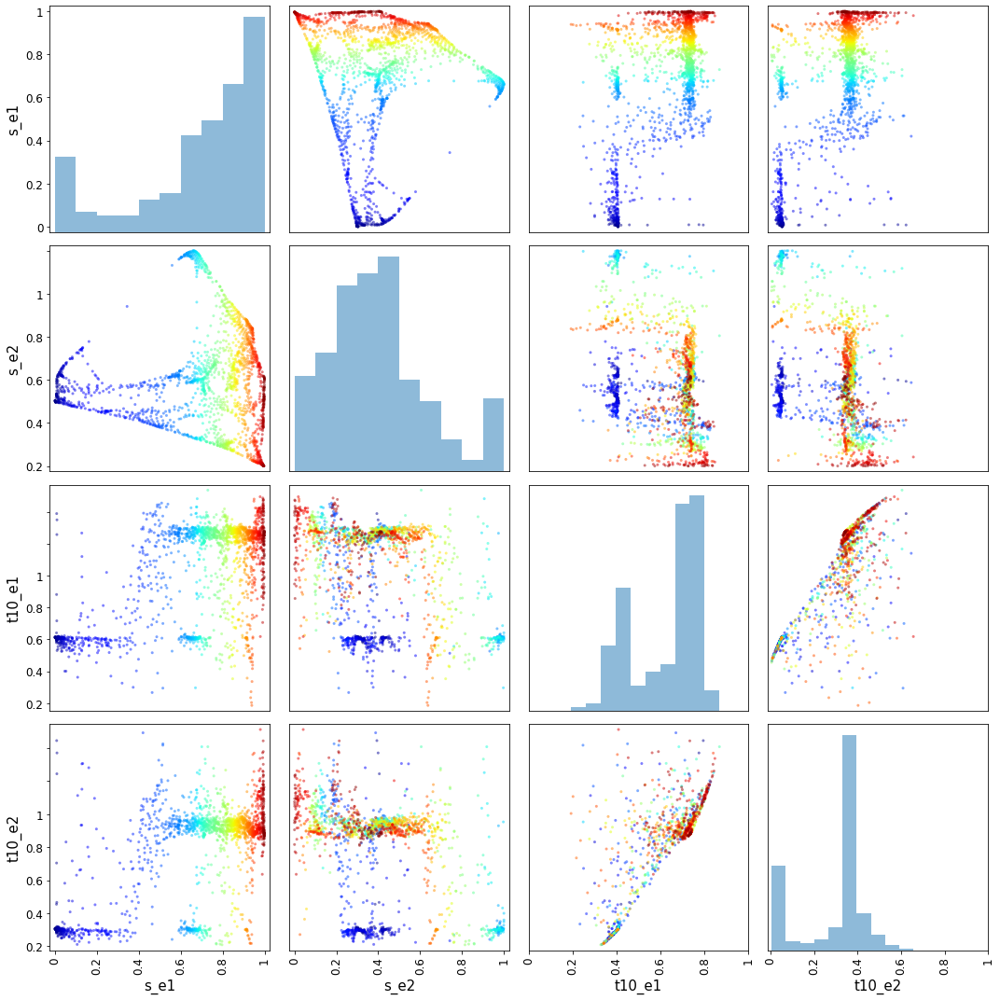

In [587]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='inferiorparietal', 
                  target_id='precentral', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Precentral, Target: Rostralmiddlefrontal

Souce shape: (1977, 4800)
Target shape: (1591, 4800)
Neighborhood size: 1


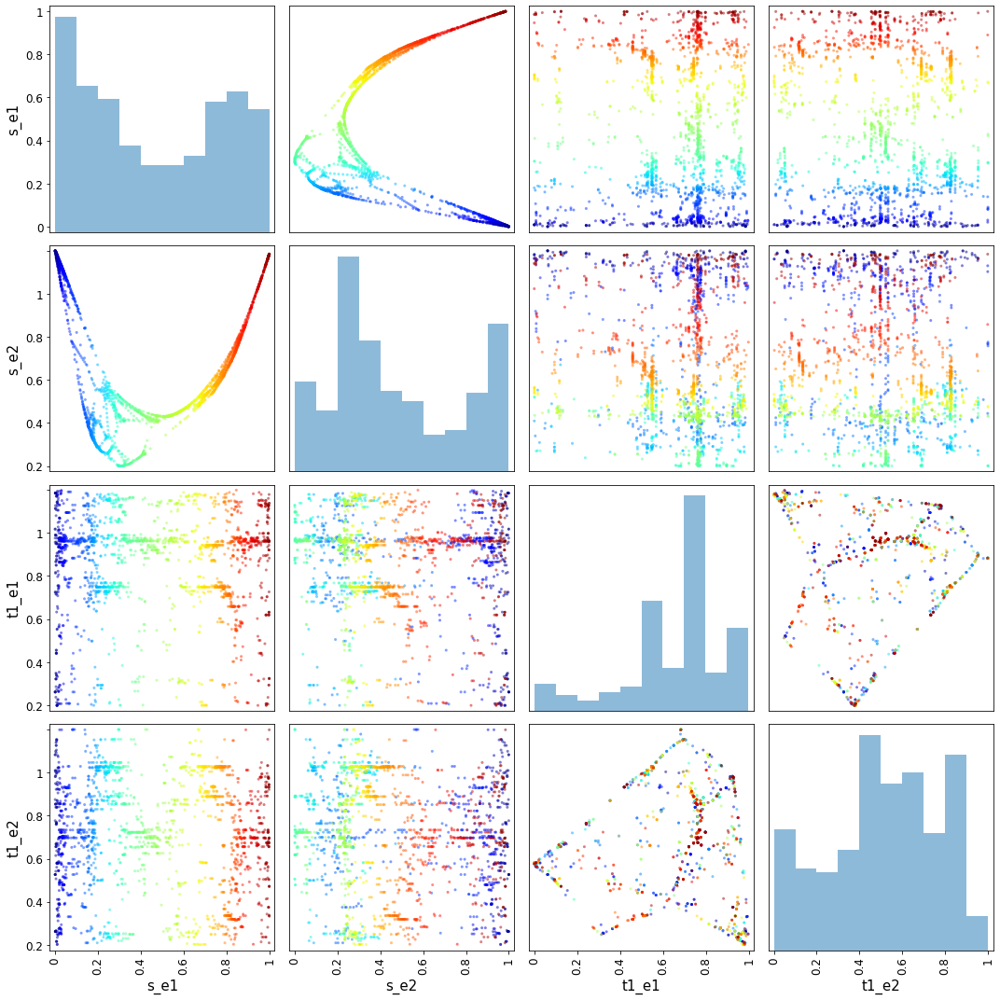

Neighborhood size: 5


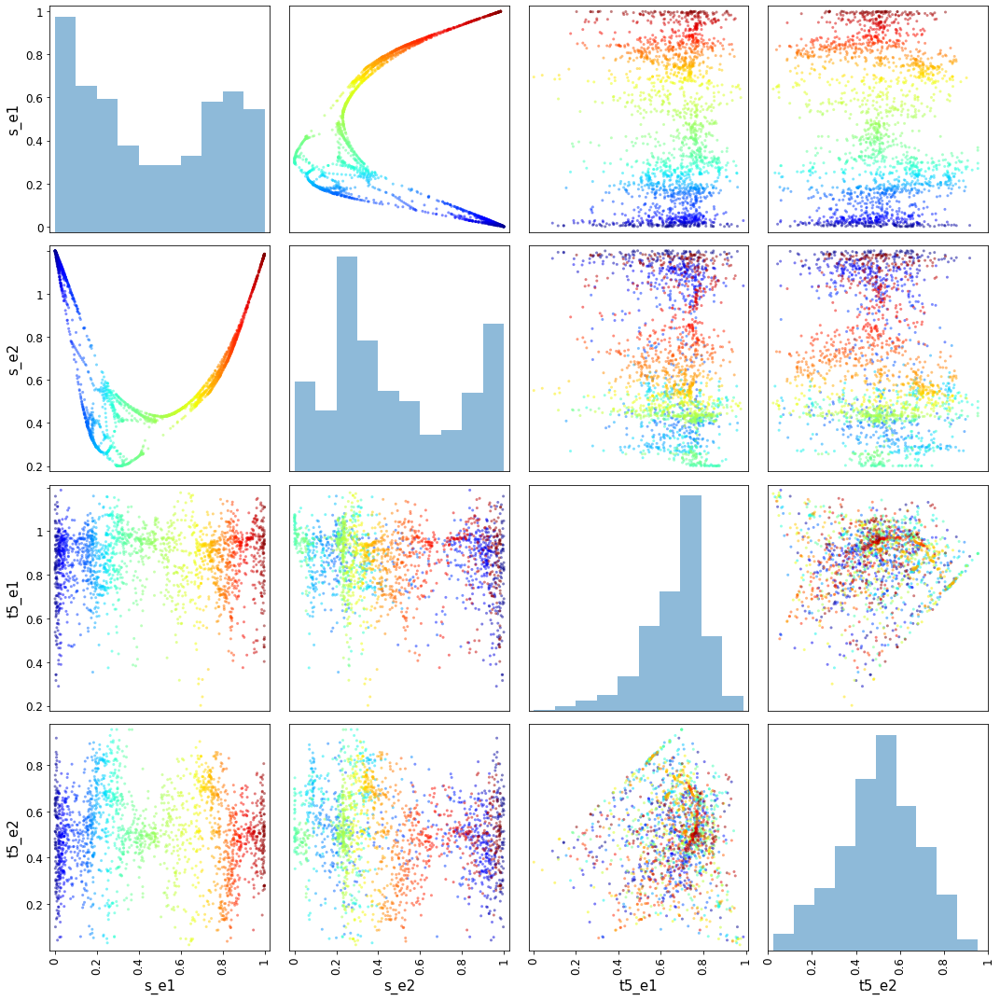

Neighborhood size: 10


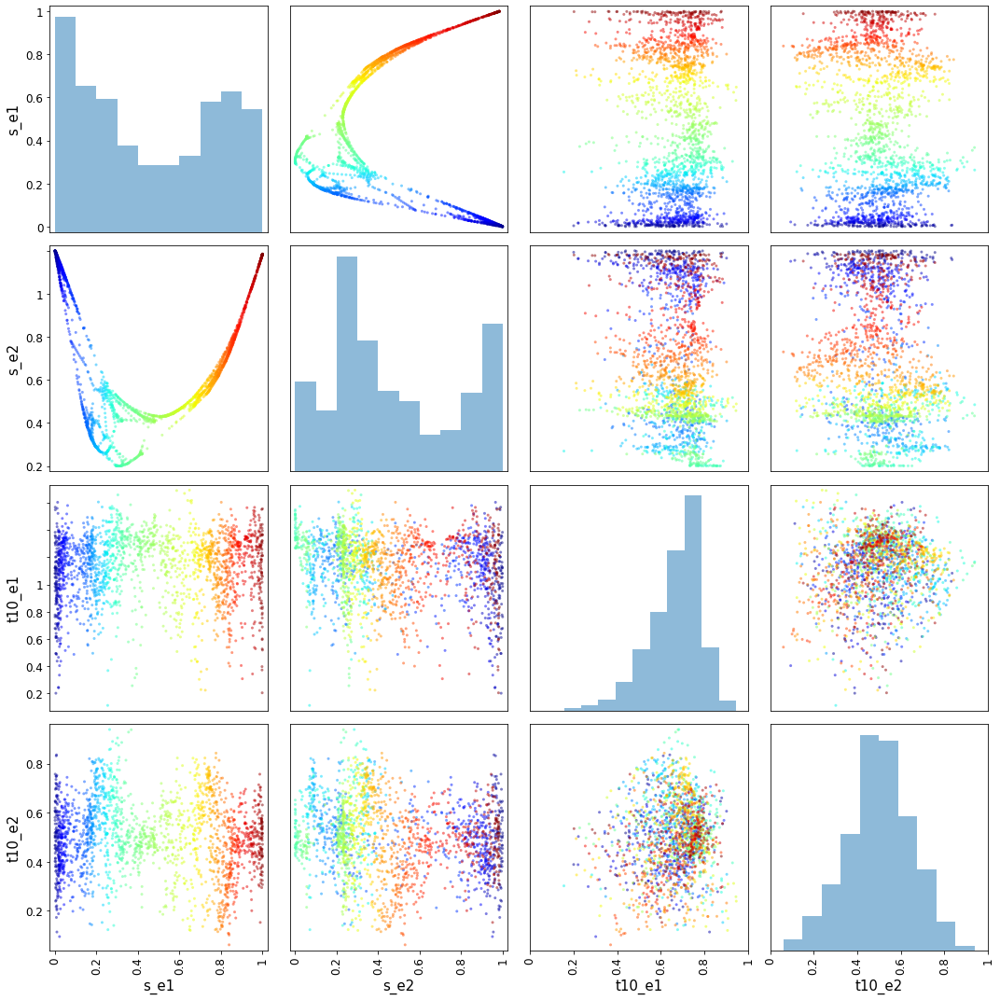

In [588]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='precentral', 
                  target_id='rostralmiddlefrontal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Rostralmiddlefrontal, Target: Precentral

Souce shape: (1591, 4800)
Target shape: (1977, 4800)
Neighborhood size: 1


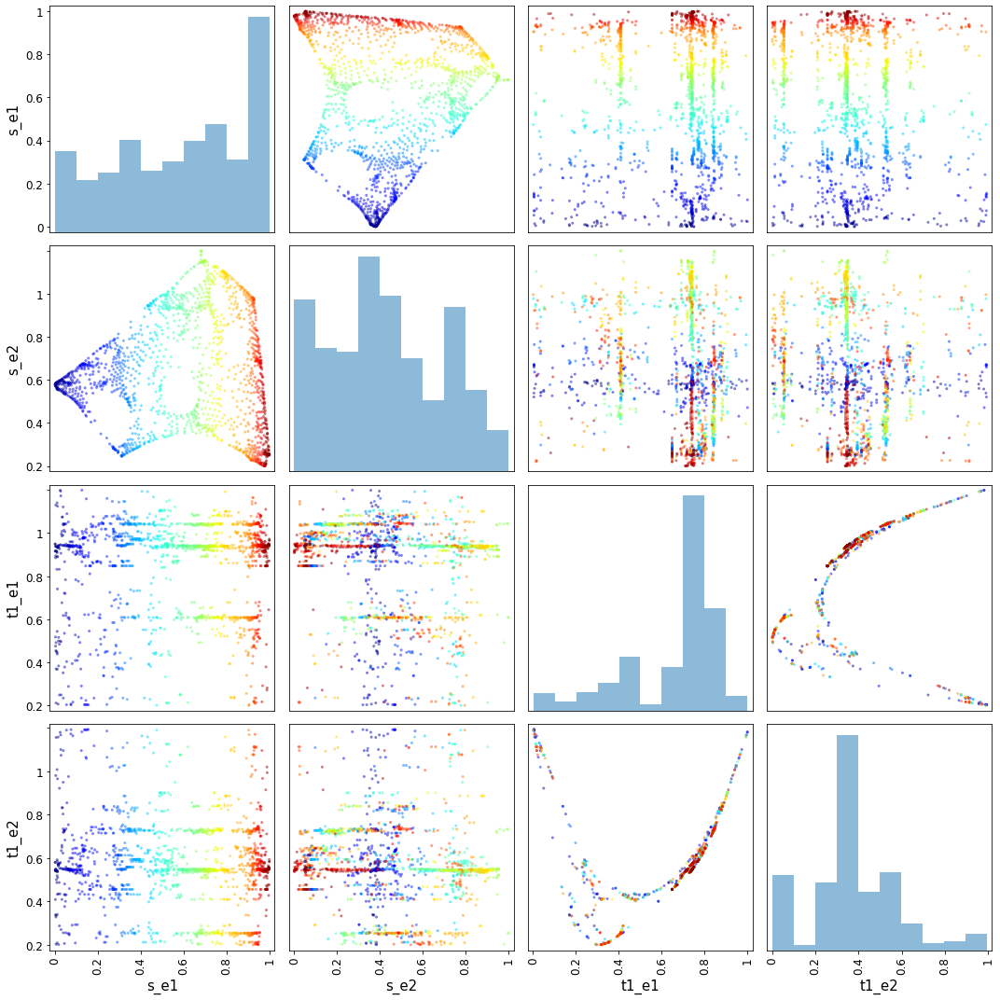

Neighborhood size: 5


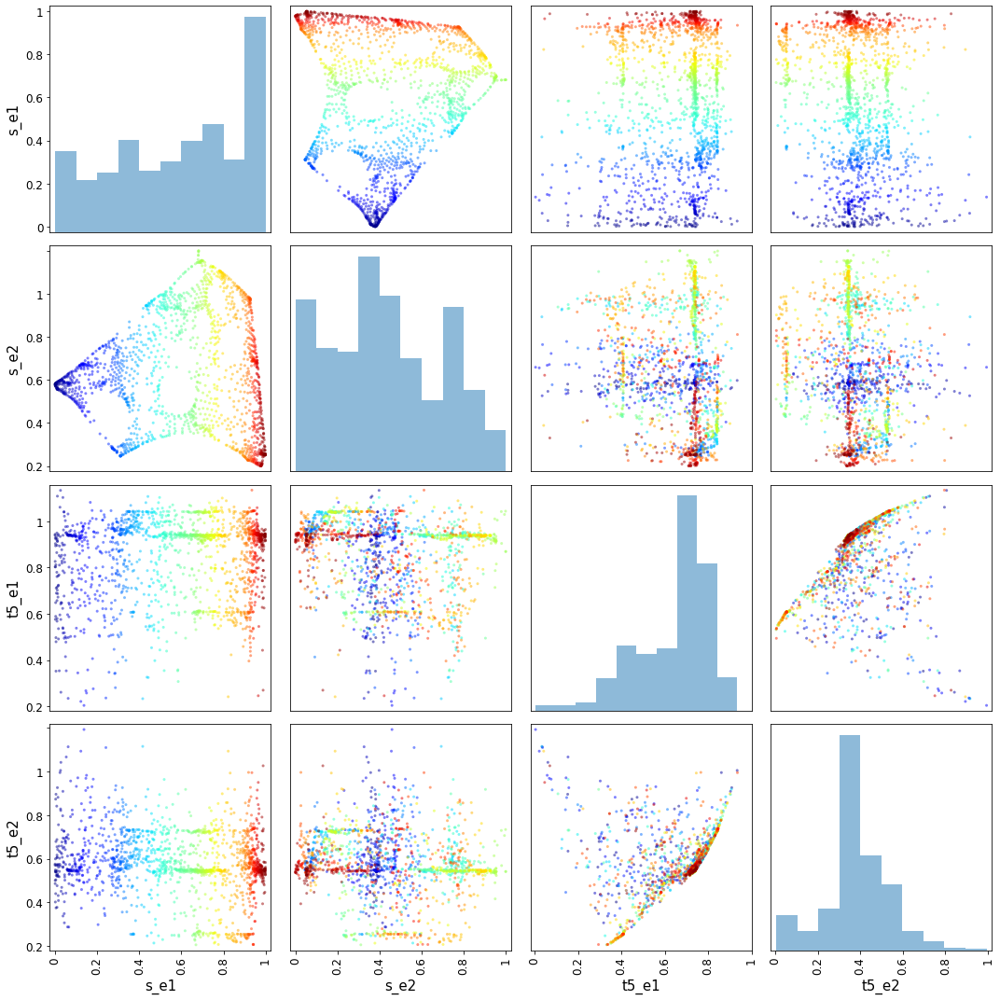

Neighborhood size: 10


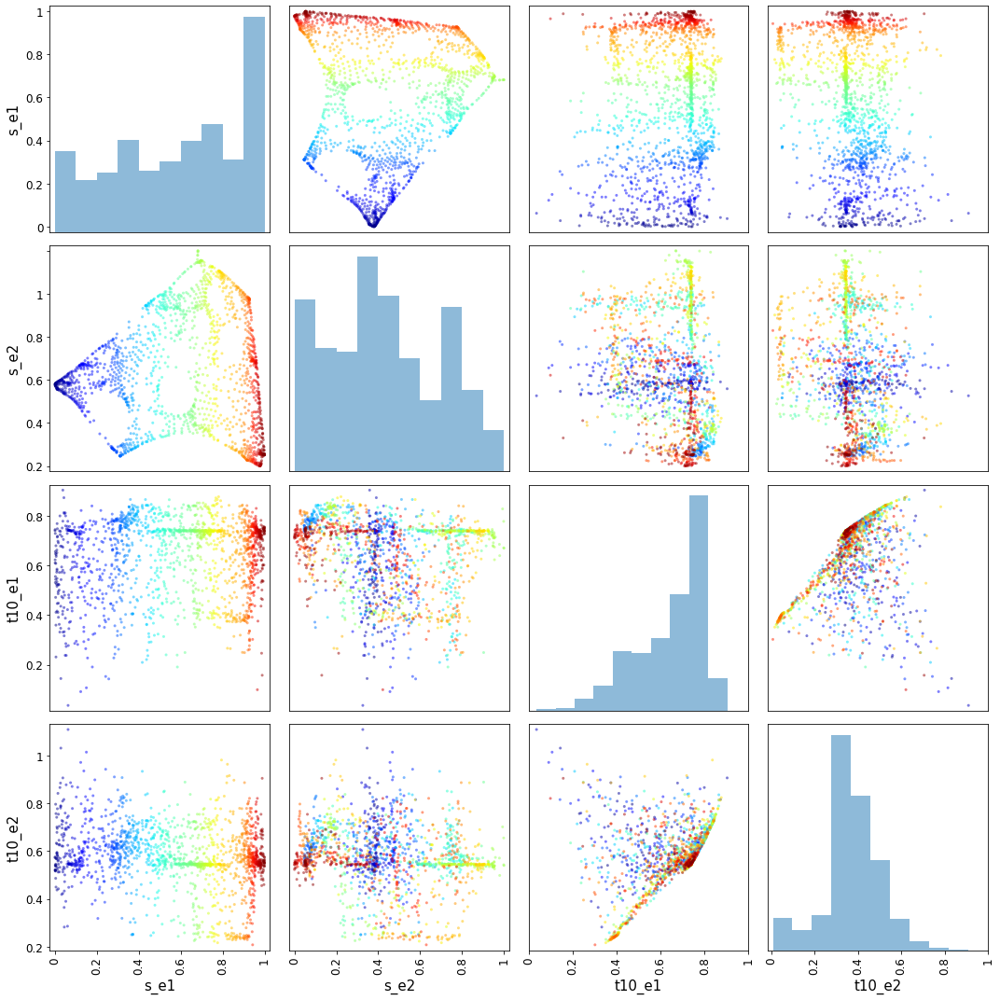

In [589]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='rostralmiddlefrontal', 
                  target_id='precentral', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: middletemporal, Target: inferiorparietal

Souce shape: (887, 4800)
Target shape: (1817, 4800)
Neighborhood size: 1


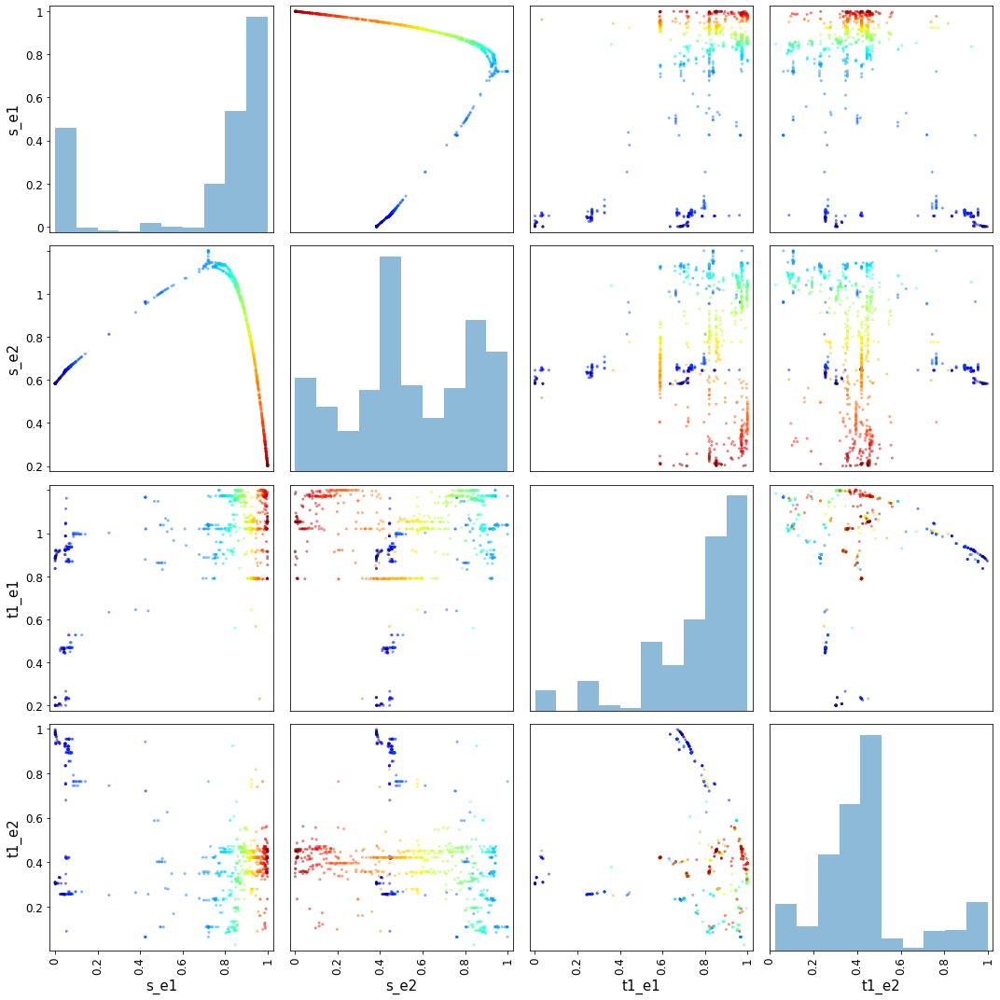

Neighborhood size: 5


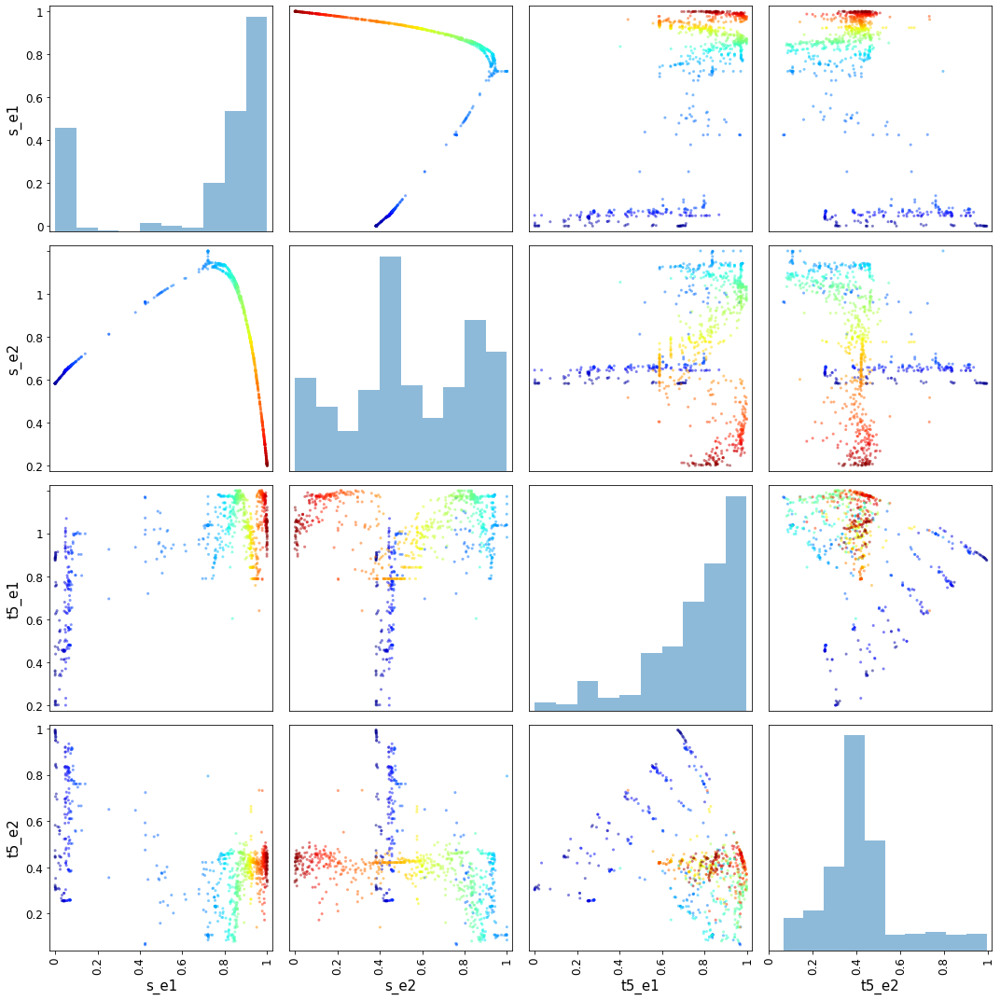

Neighborhood size: 10


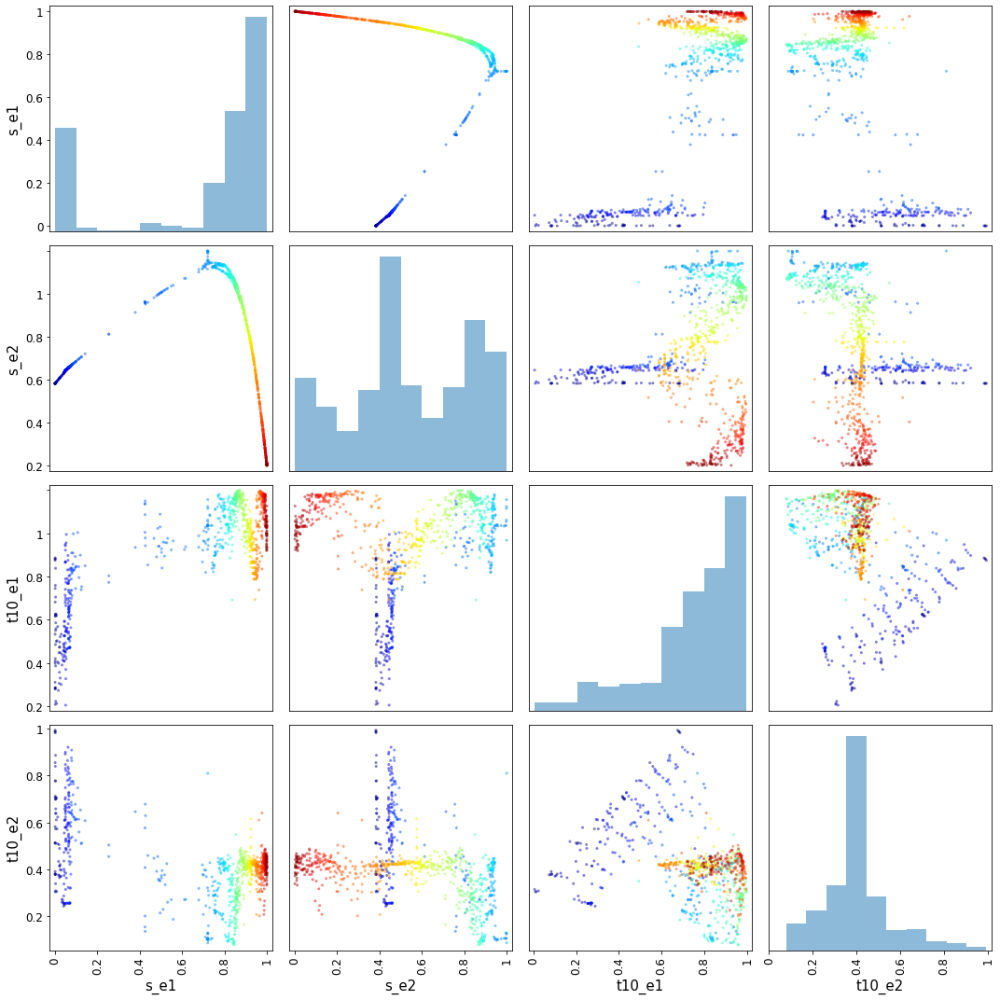

In [590]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='middletemporal', 
                  target_id='inferiorparietal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: inferiorparietal, Target: middletemporal

Souce shape: (1817, 4800)
Target shape: (887, 4800)
Neighborhood size: 1


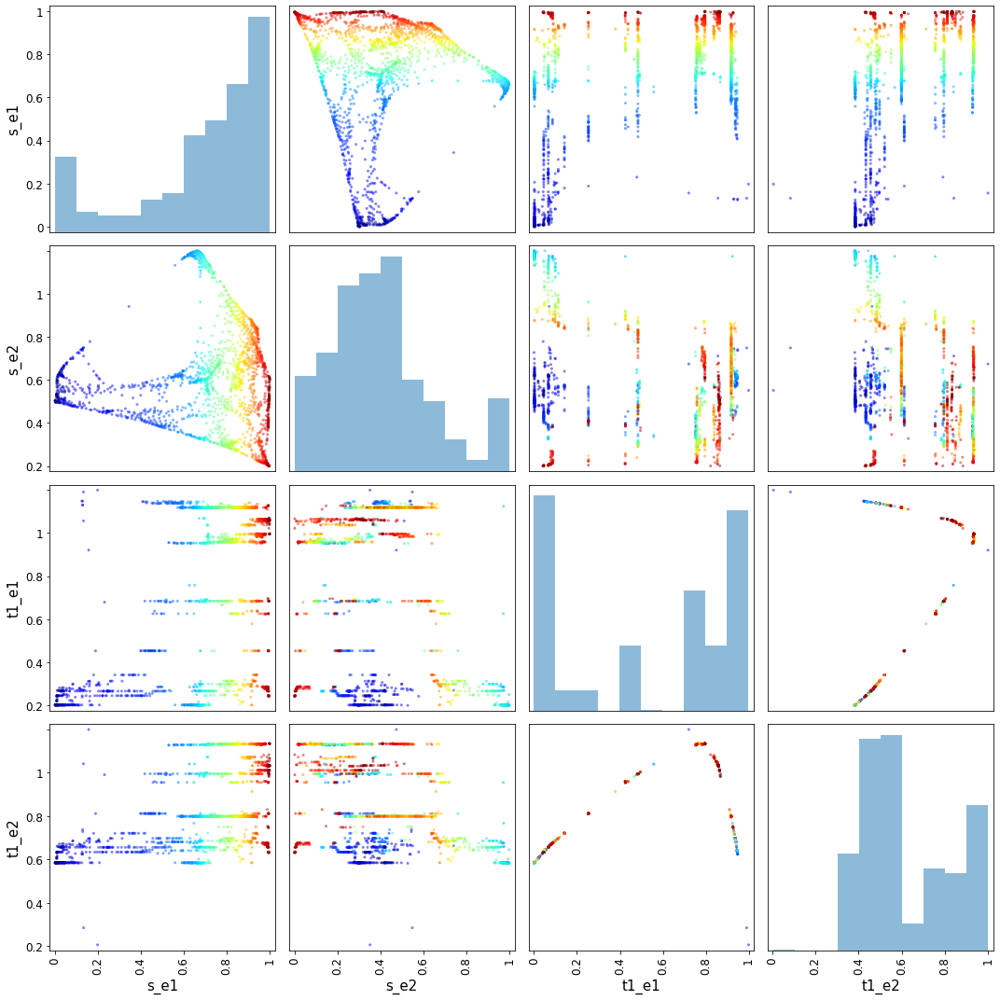

Neighborhood size: 5


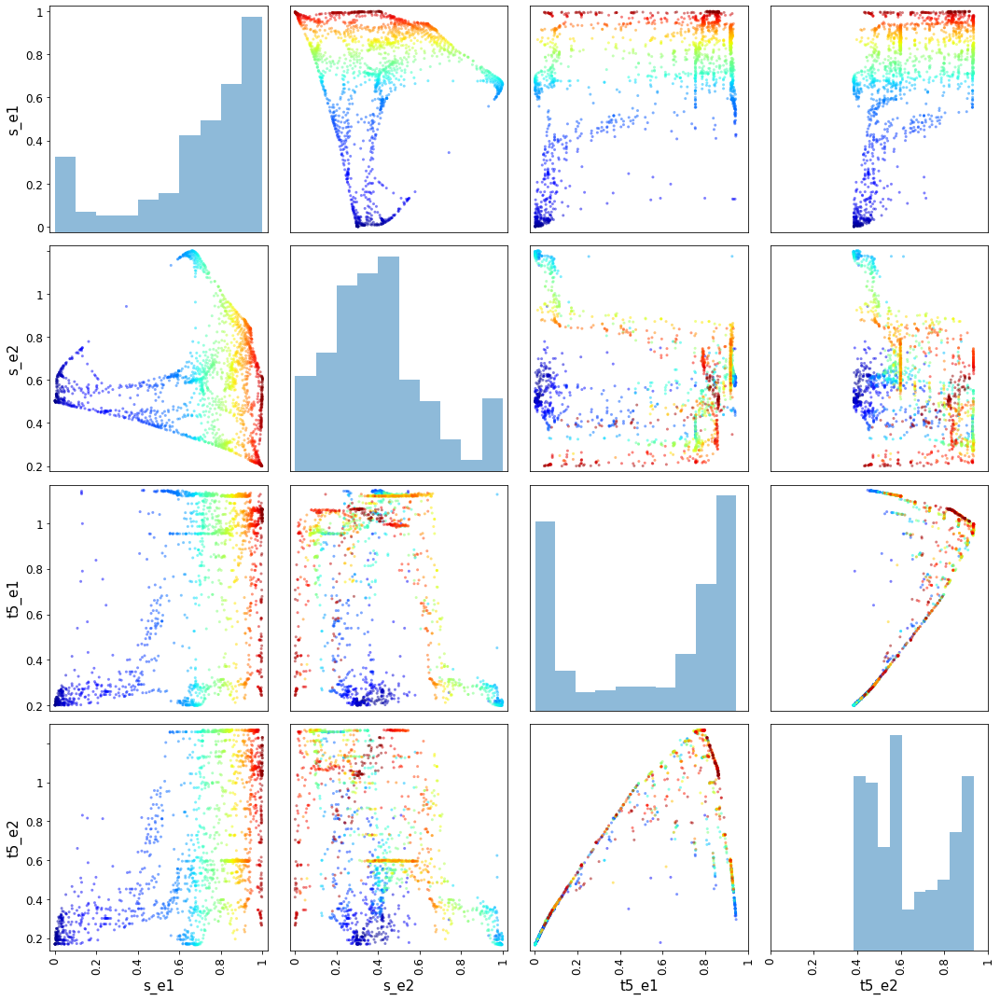

Neighborhood size: 10


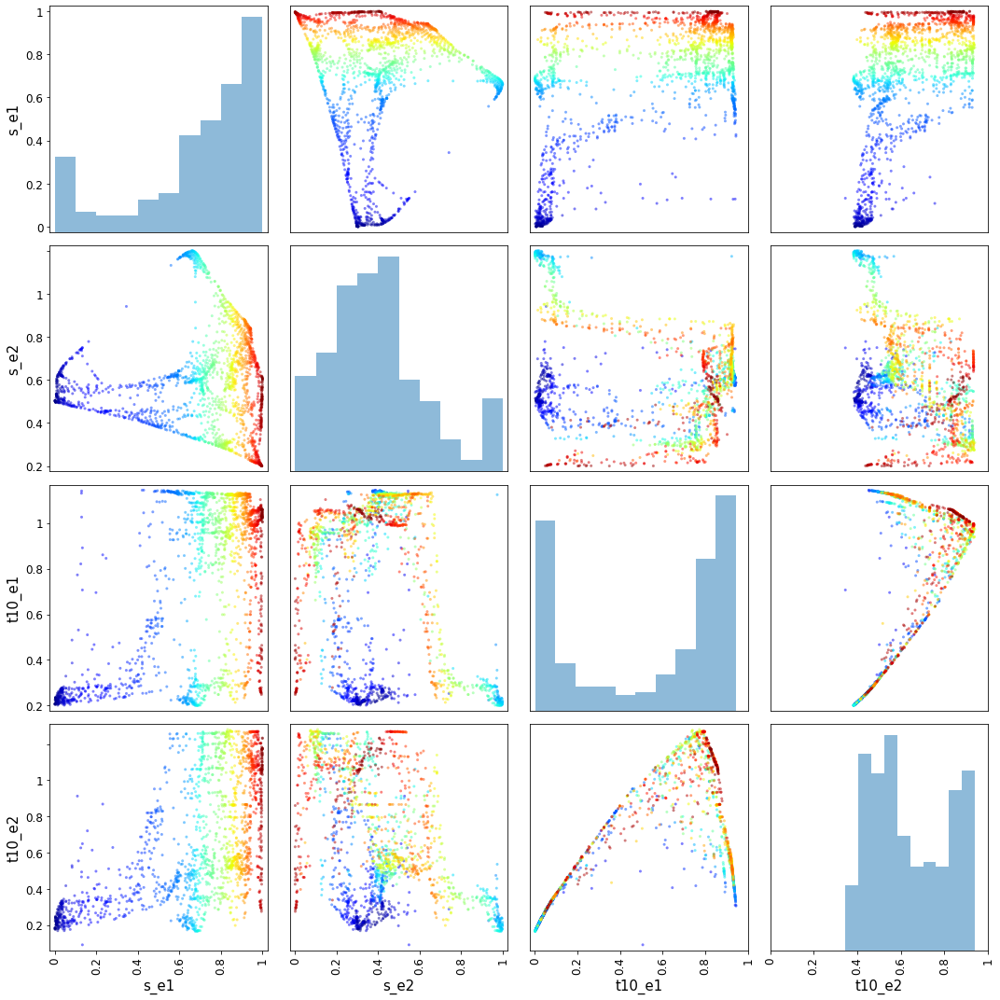

In [591]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='inferiorparietal', 
                  target_id='middletemporal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: superiortemporal, Target: fusiform

Souce shape: (1392, 4800)
Target shape: (923, 4800)
Neighborhood size: 1


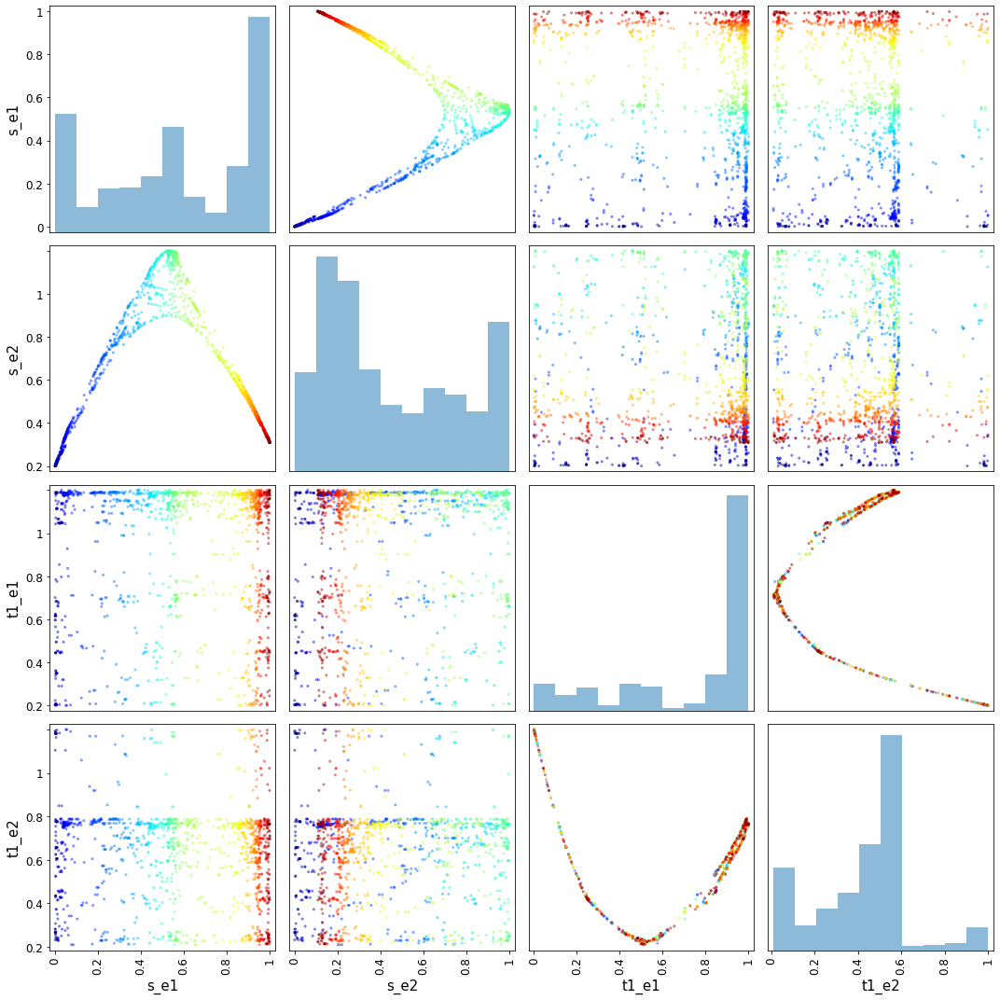

Neighborhood size: 5


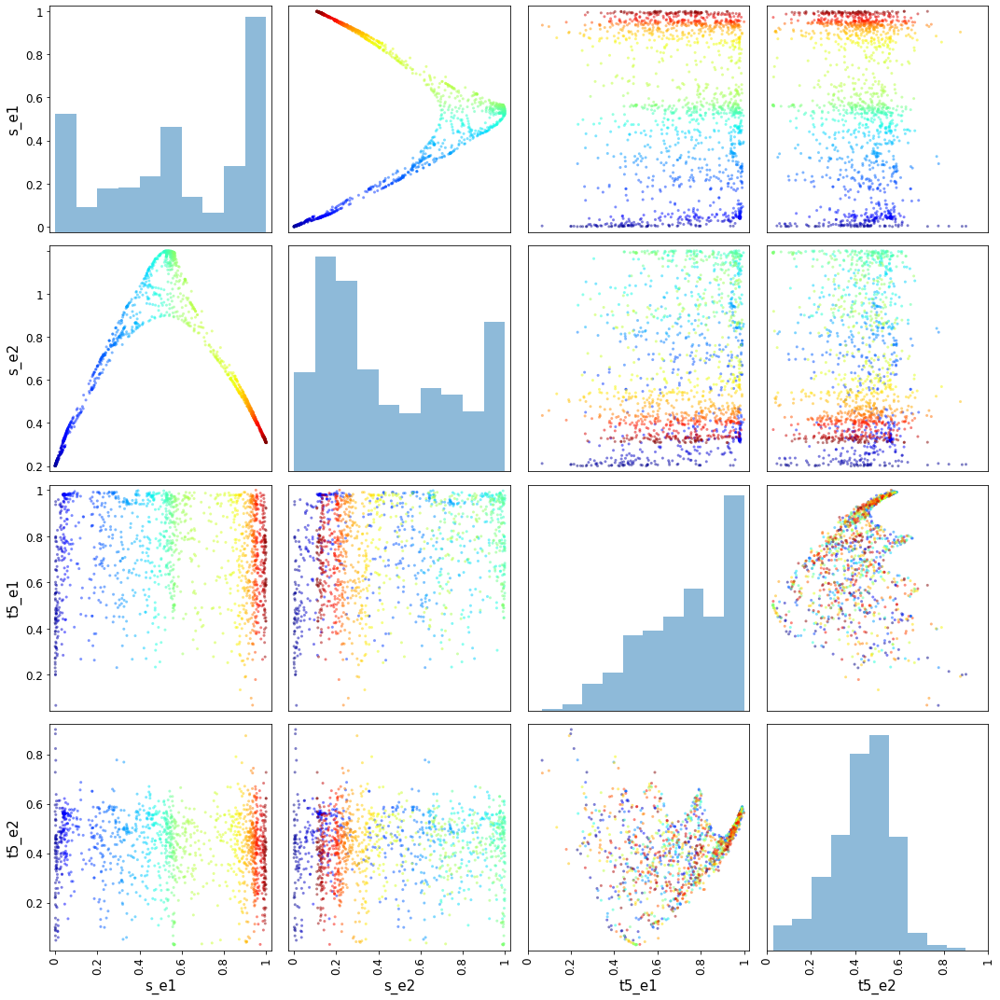

Neighborhood size: 10


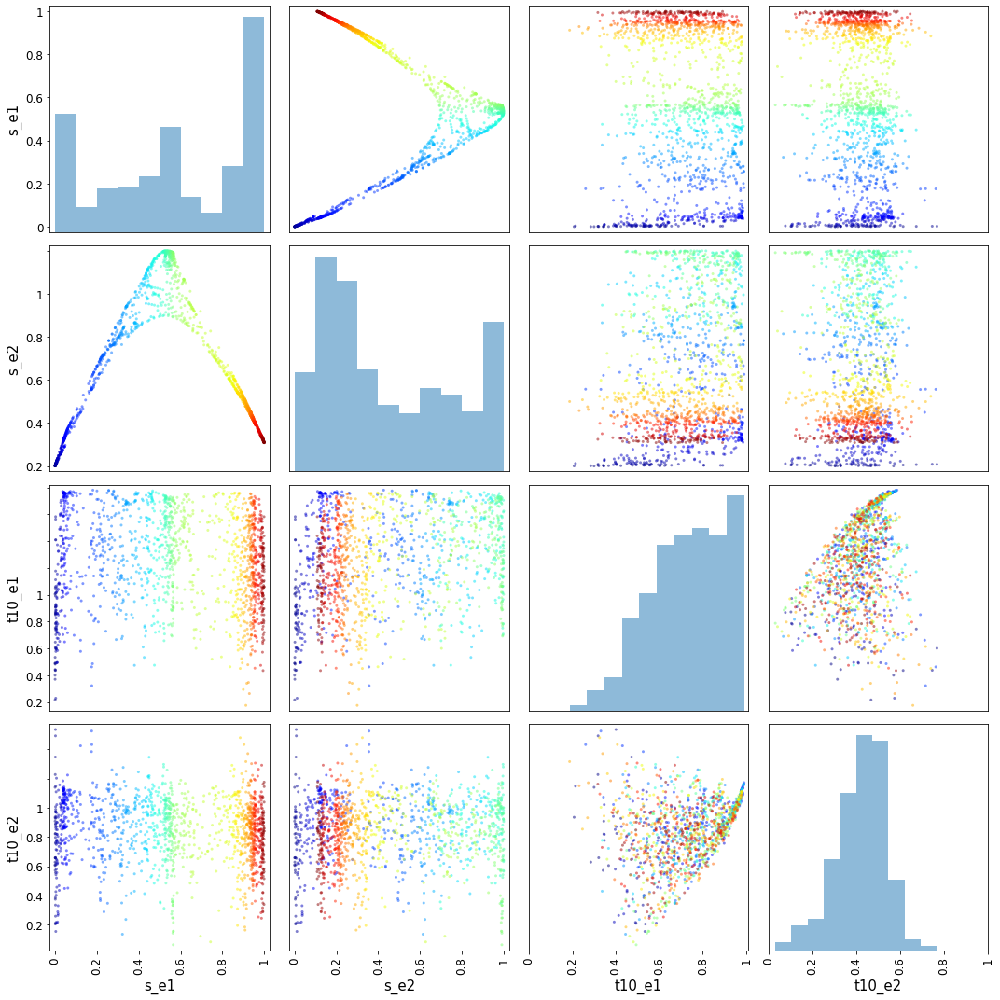

In [592]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='superiortemporal', 
                  target_id='fusiform', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: fusiform, Target: superiortemporal

Souce shape: (923, 4800)
Target shape: (1392, 4800)
Neighborhood size: 1


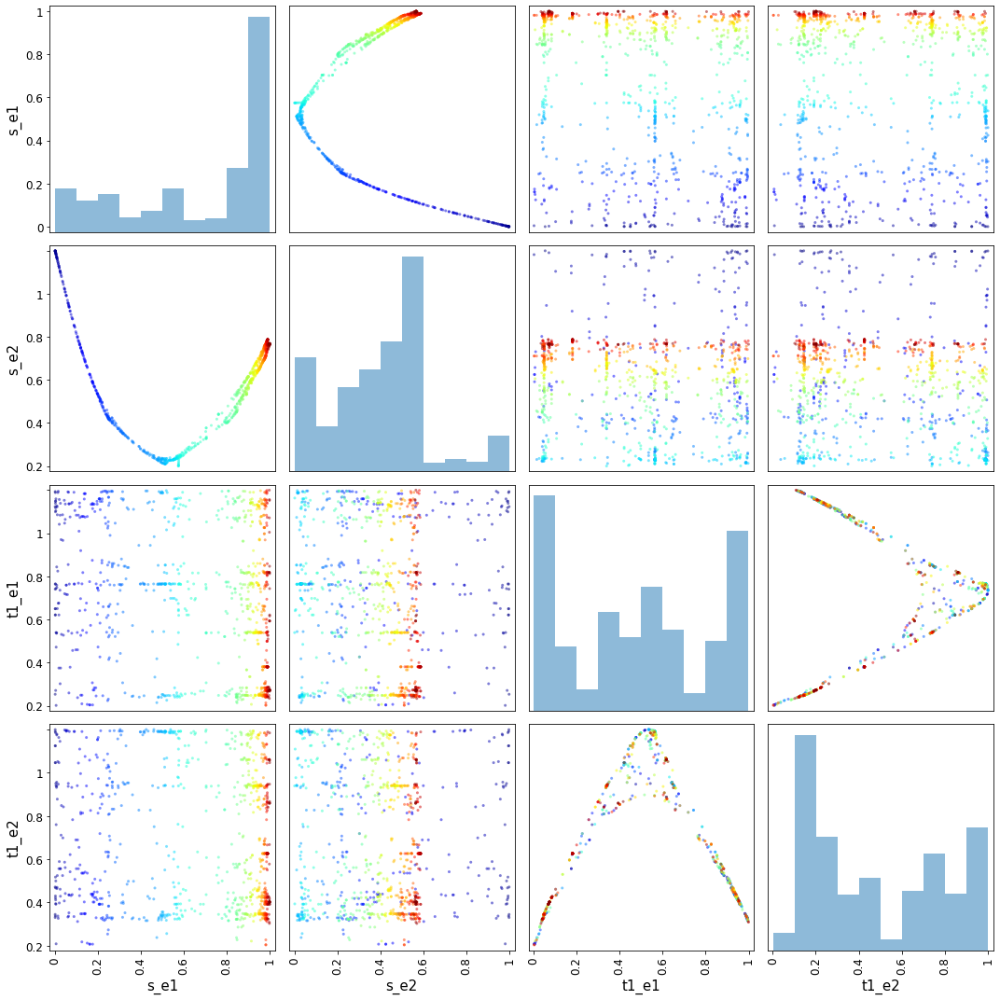

Neighborhood size: 5


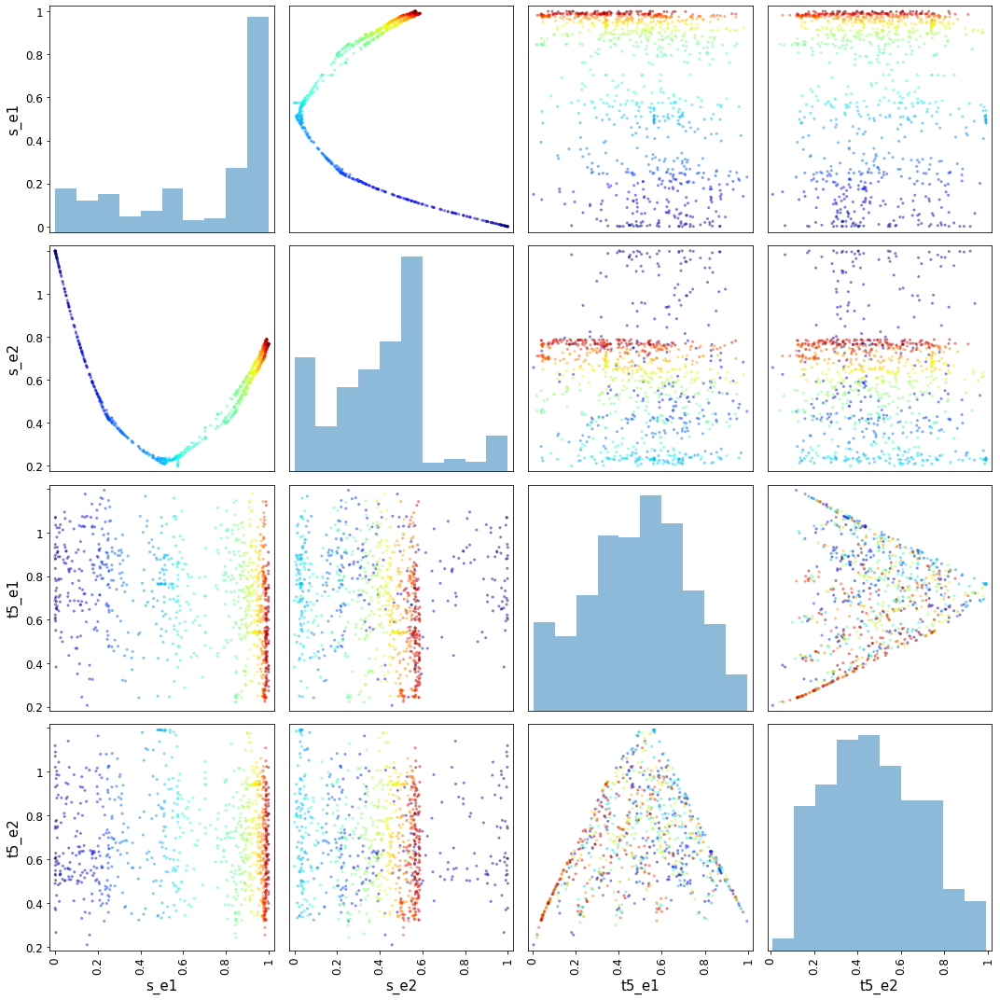

Neighborhood size: 10


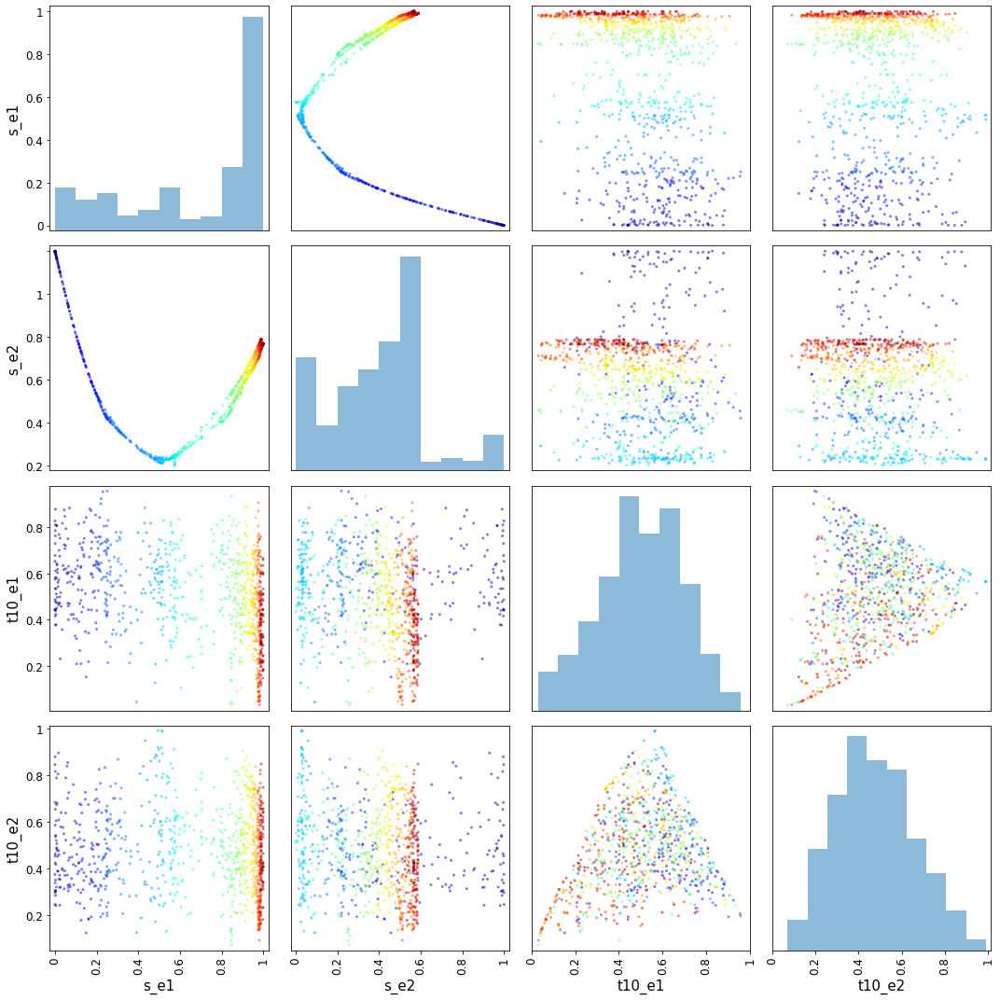

In [593]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='fusiform', 
                  target_id='superiortemporal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Superiortemporal, Target: Inferiortemporal

Souce shape: (1392, 4800)
Target shape: (900, 4800)
Neighborhood size: 1


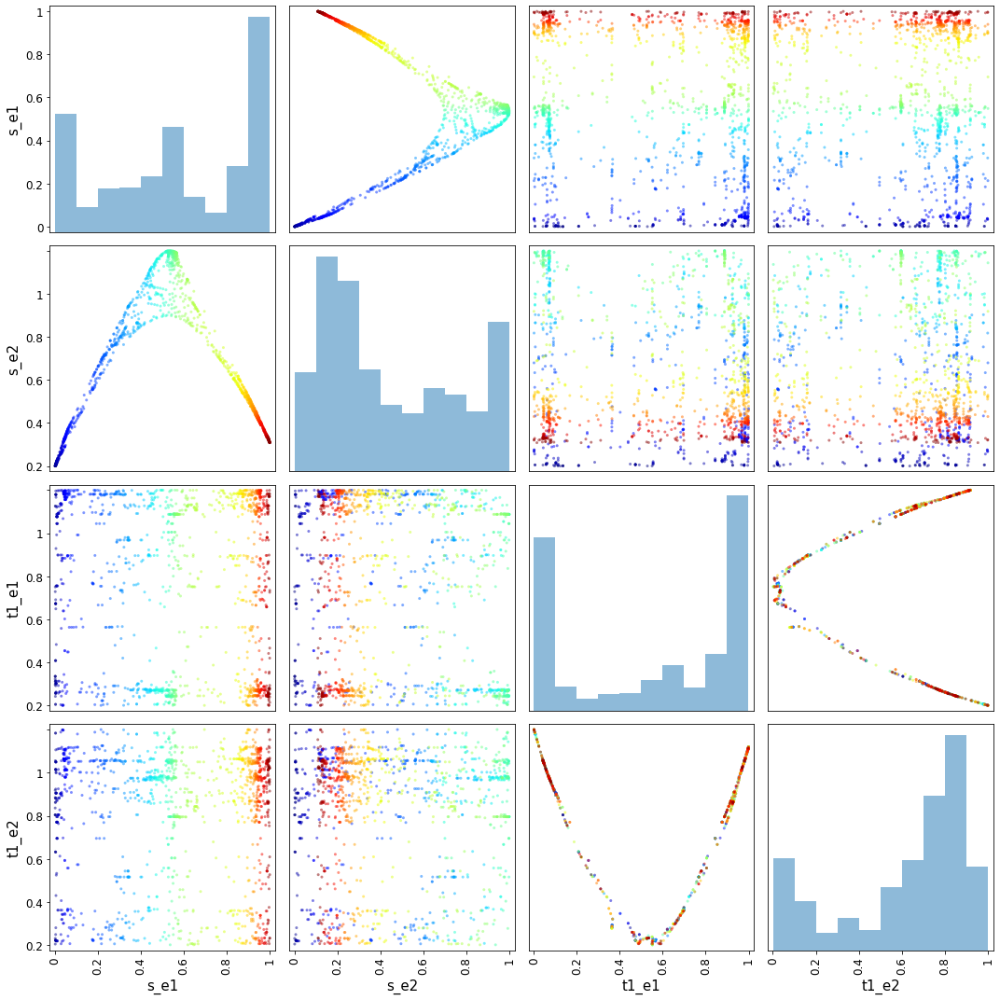

Neighborhood size: 5


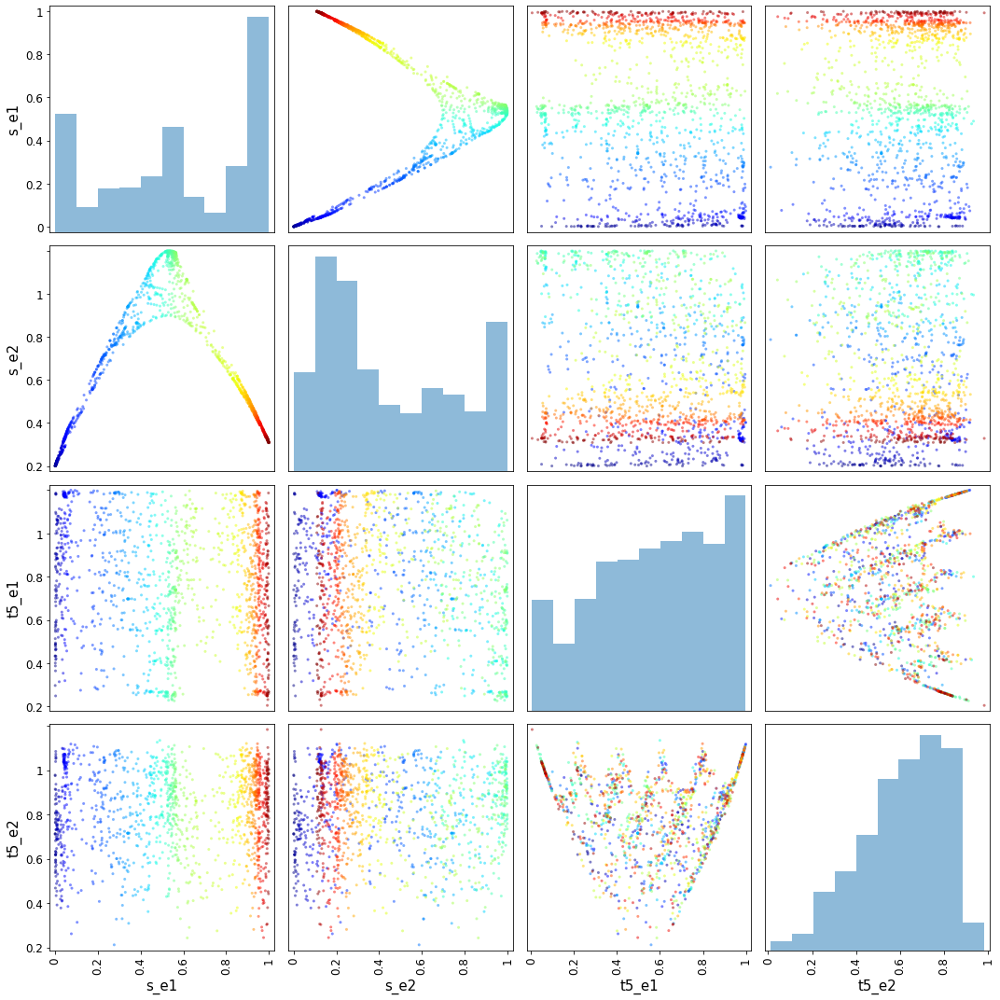

Neighborhood size: 10


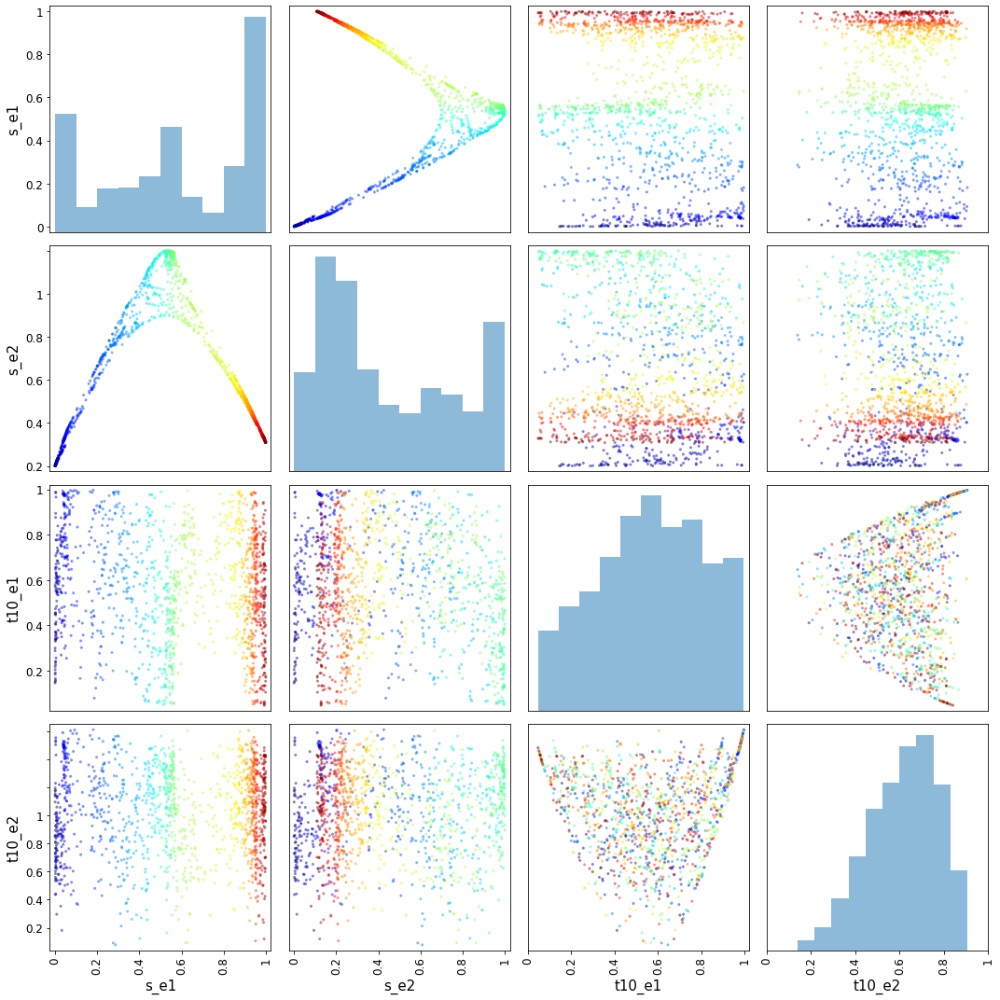

In [594]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='superiortemporal', 
                  target_id='inferiortemporal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Inferiortemporal, Target: Superiortemporal

Souce shape: (900, 4800)
Target shape: (1392, 4800)
Neighborhood size: 1


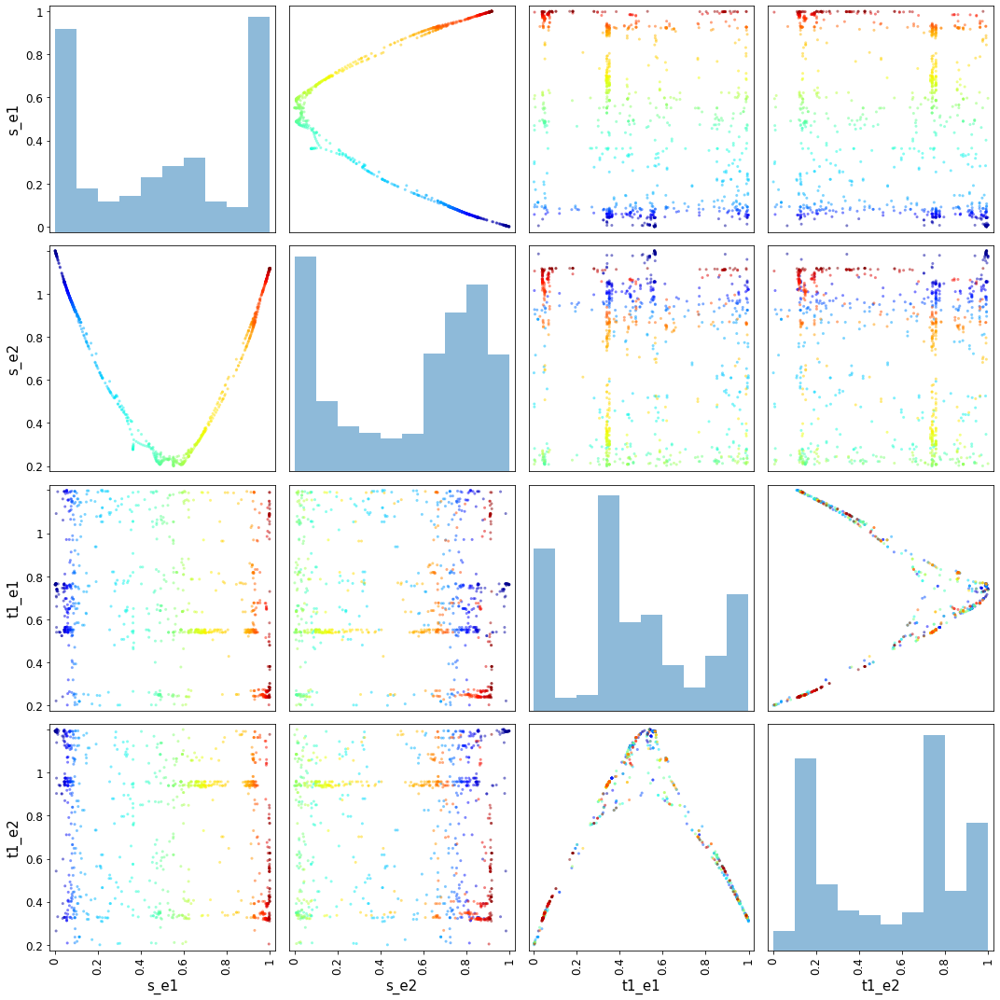

Neighborhood size: 5


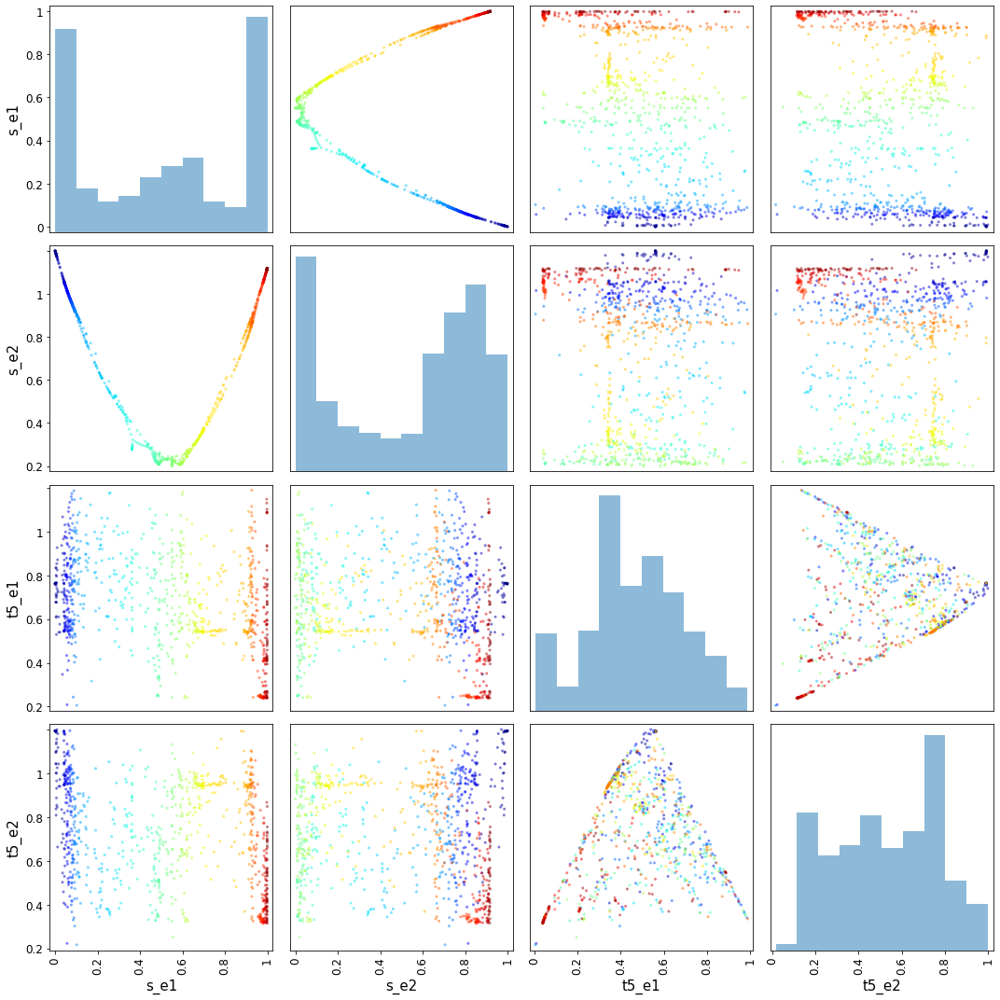

Neighborhood size: 10


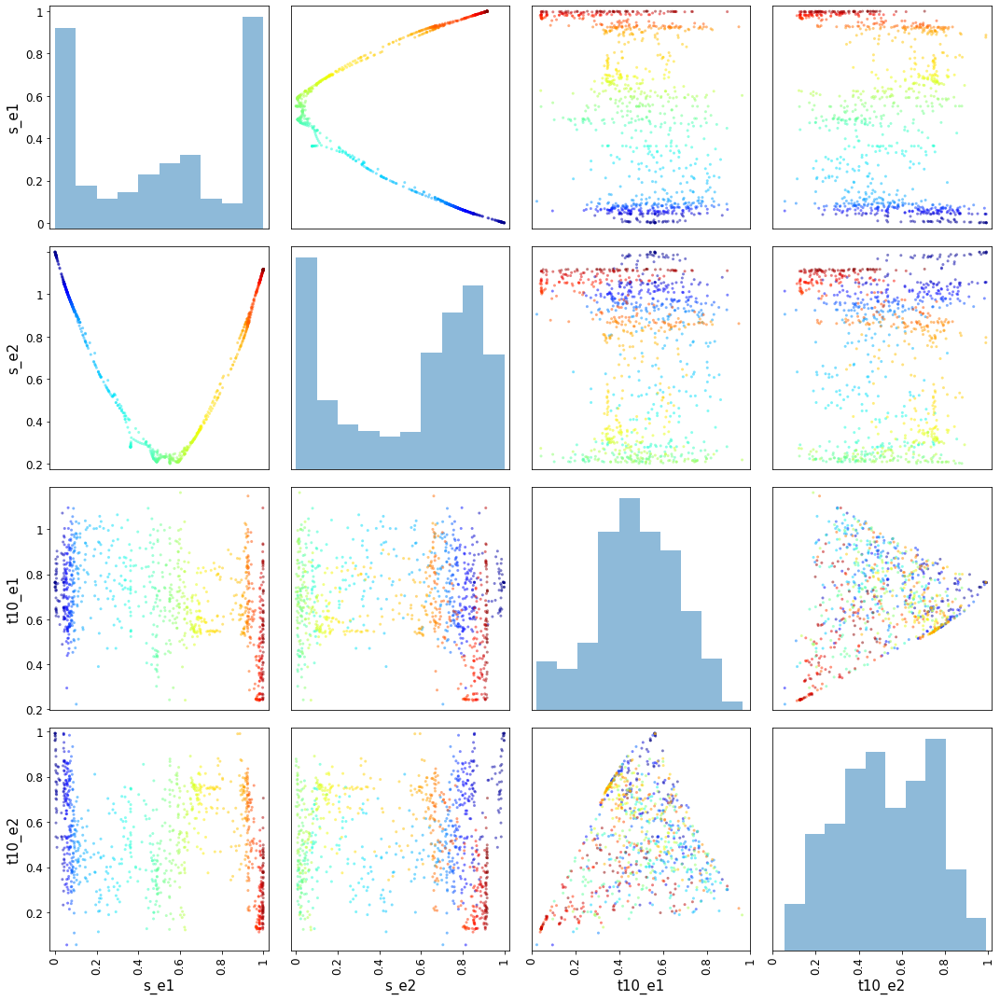

In [595]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='inferiortemporal', 
                  target_id='superiortemporal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Middletemporal, Target: Inferiortemporal

Souce shape: (887, 4800)
Target shape: (900, 4800)
Neighborhood size: 1


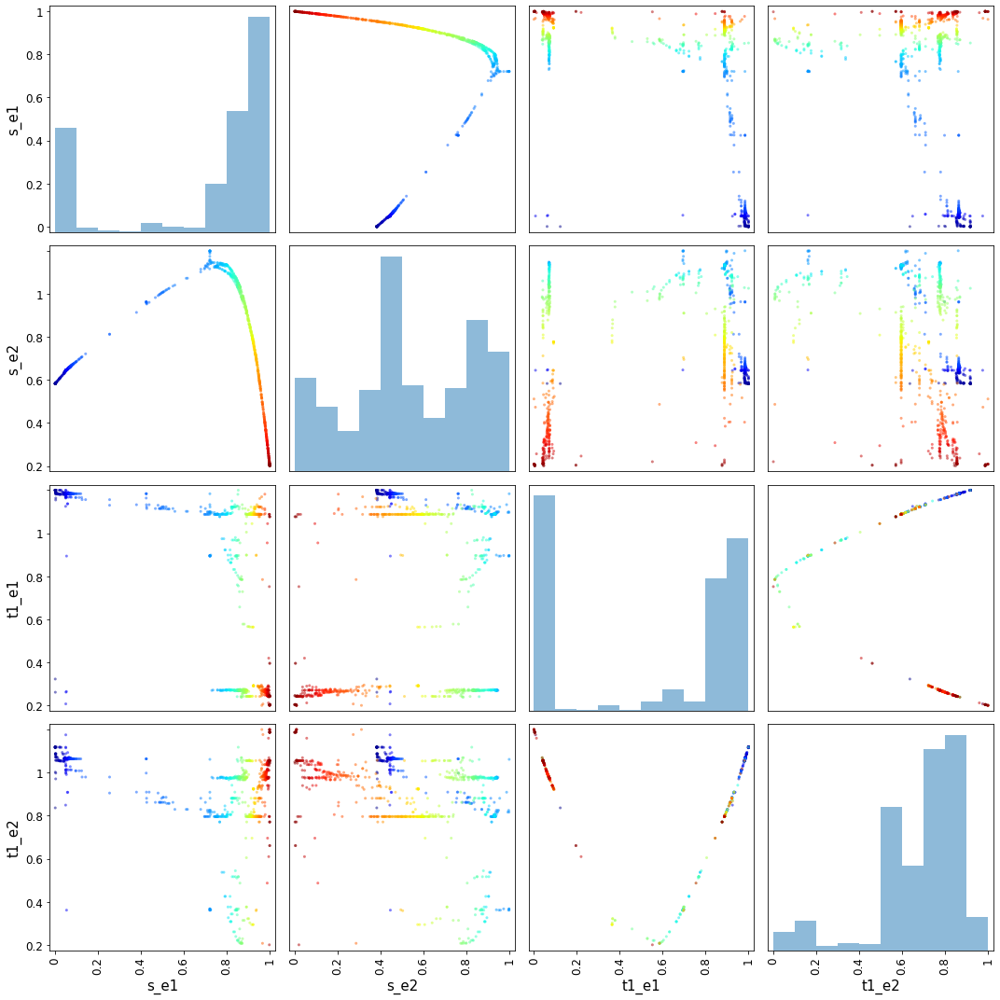

Neighborhood size: 5


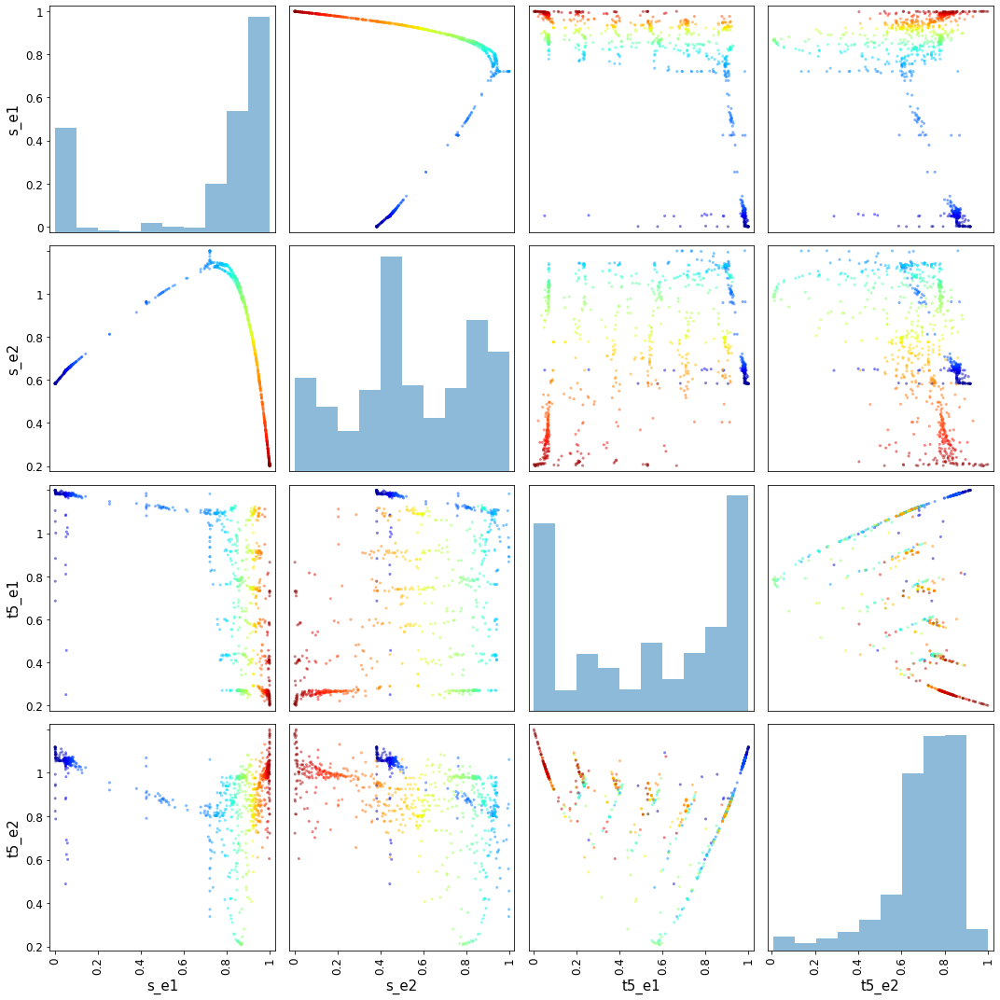

Neighborhood size: 10


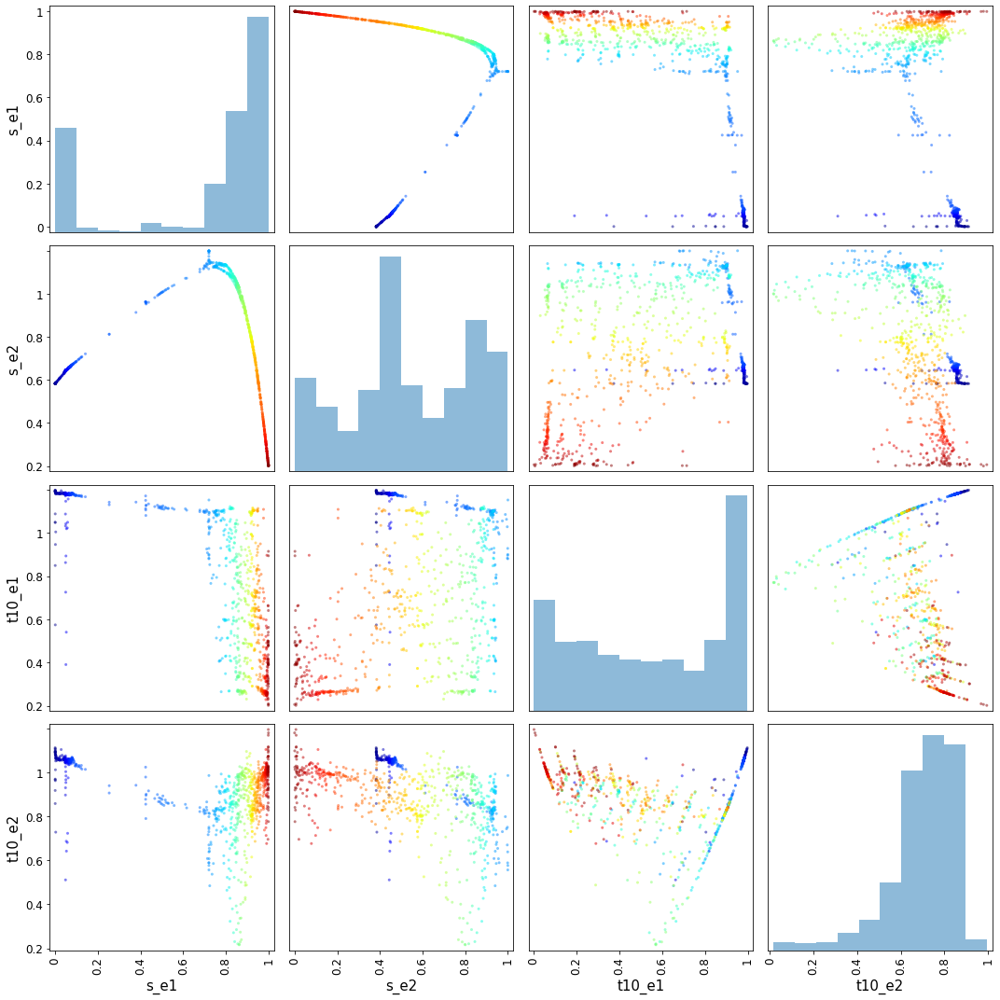

In [596]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='middletemporal', 
                  target_id='inferiortemporal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Inferiortemporal, Target: Middletemporal

Souce shape: (900, 4800)
Target shape: (887, 4800)
Neighborhood size: 1


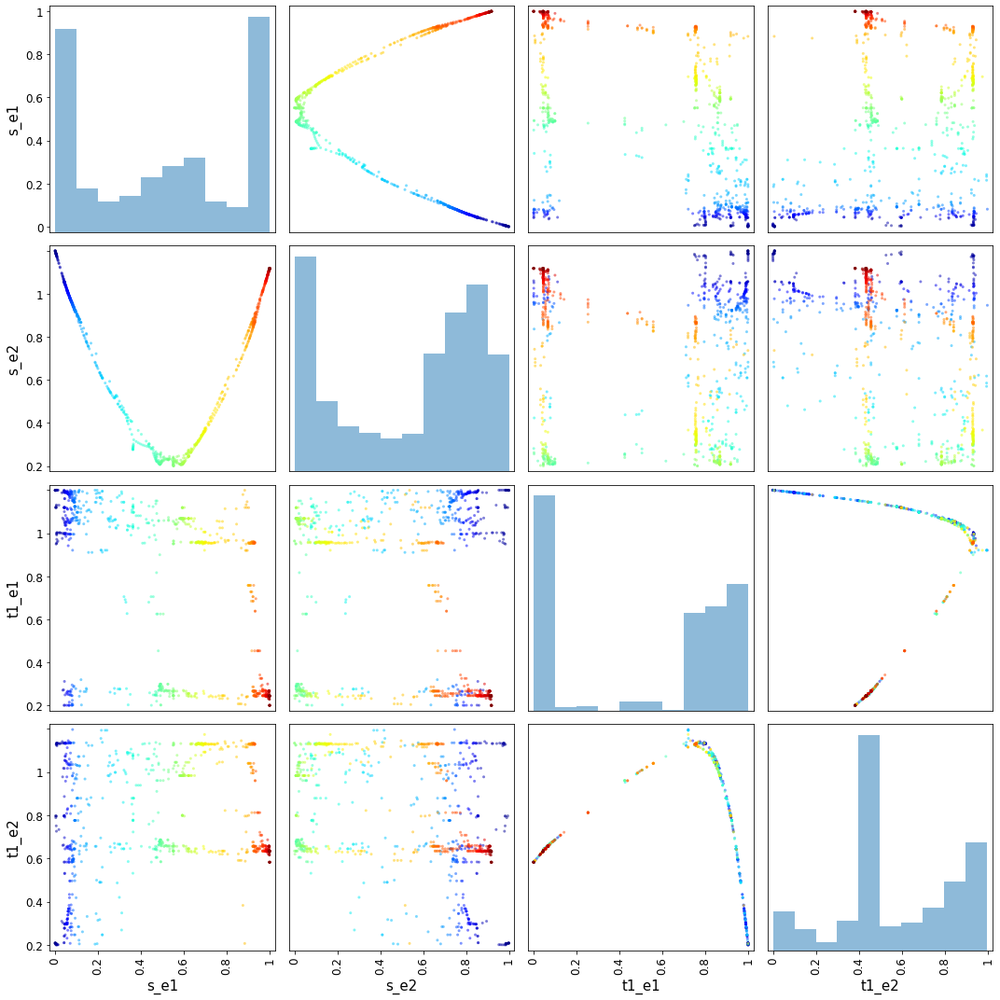

Neighborhood size: 5


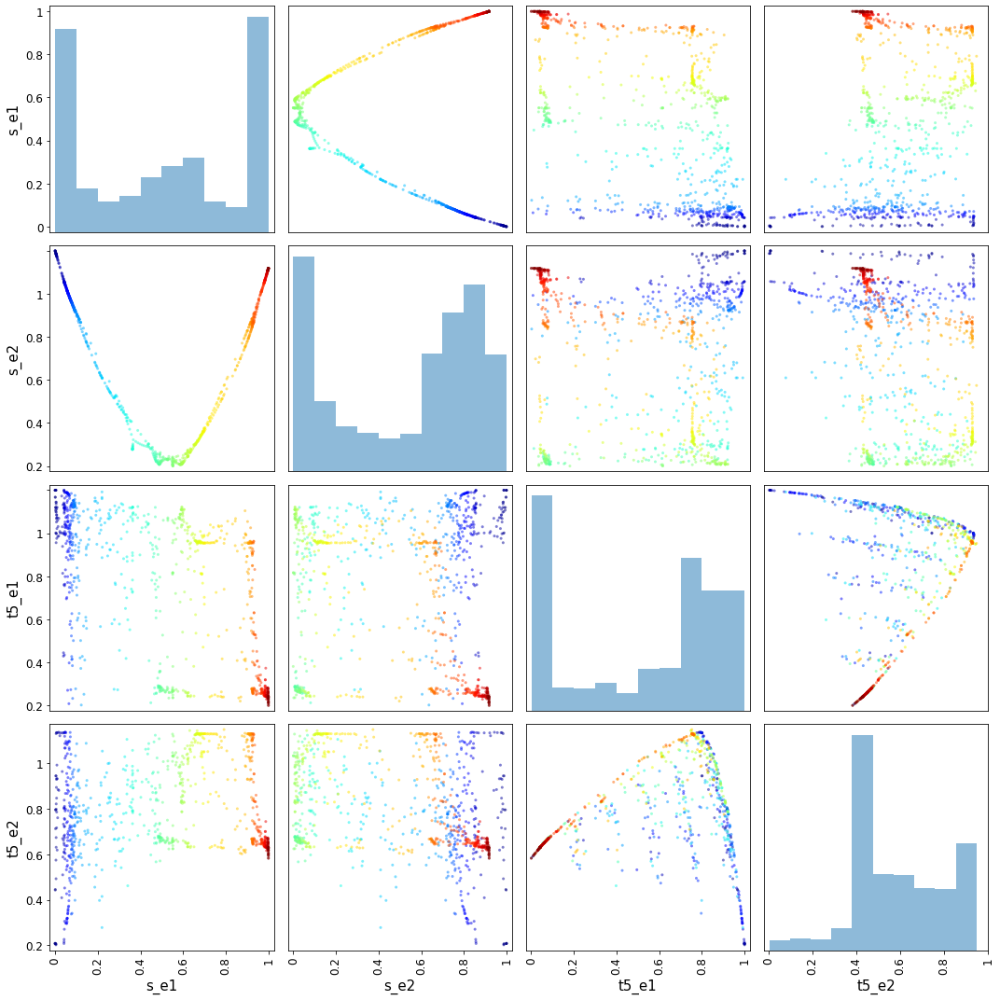

Neighborhood size: 10


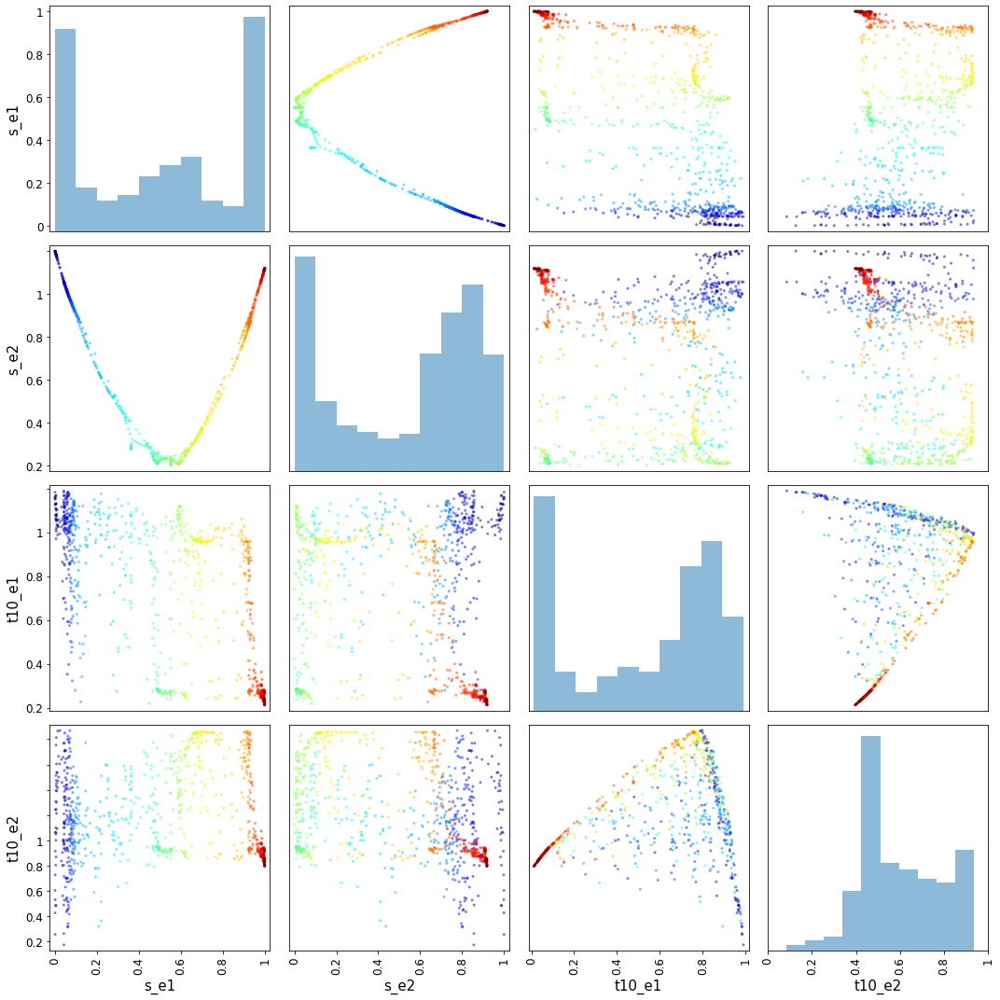

In [597]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='inferiortemporal', 
                  target_id='middletemporal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Middletemporal, Target: Middletemporal

Souce shape: (887, 4800)
Target shape: (887, 4800)
Neighborhood size: 1


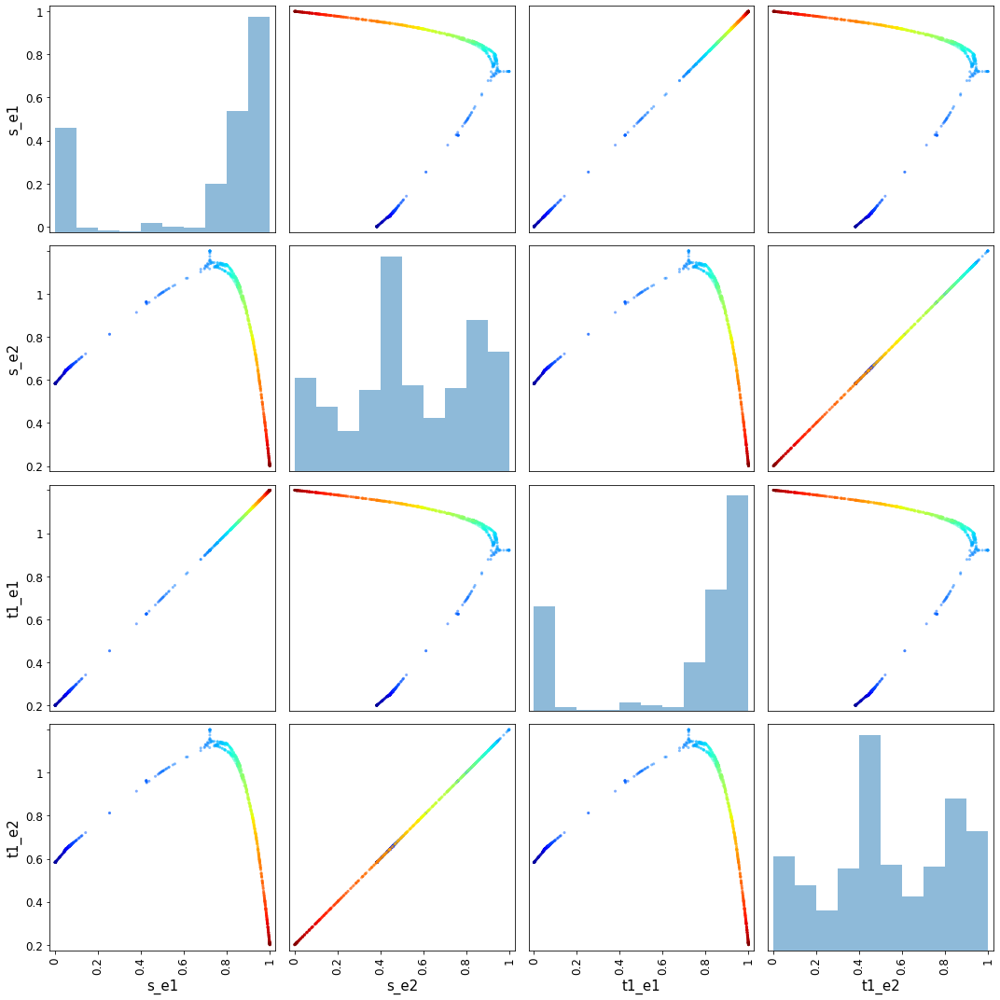

Neighborhood size: 5


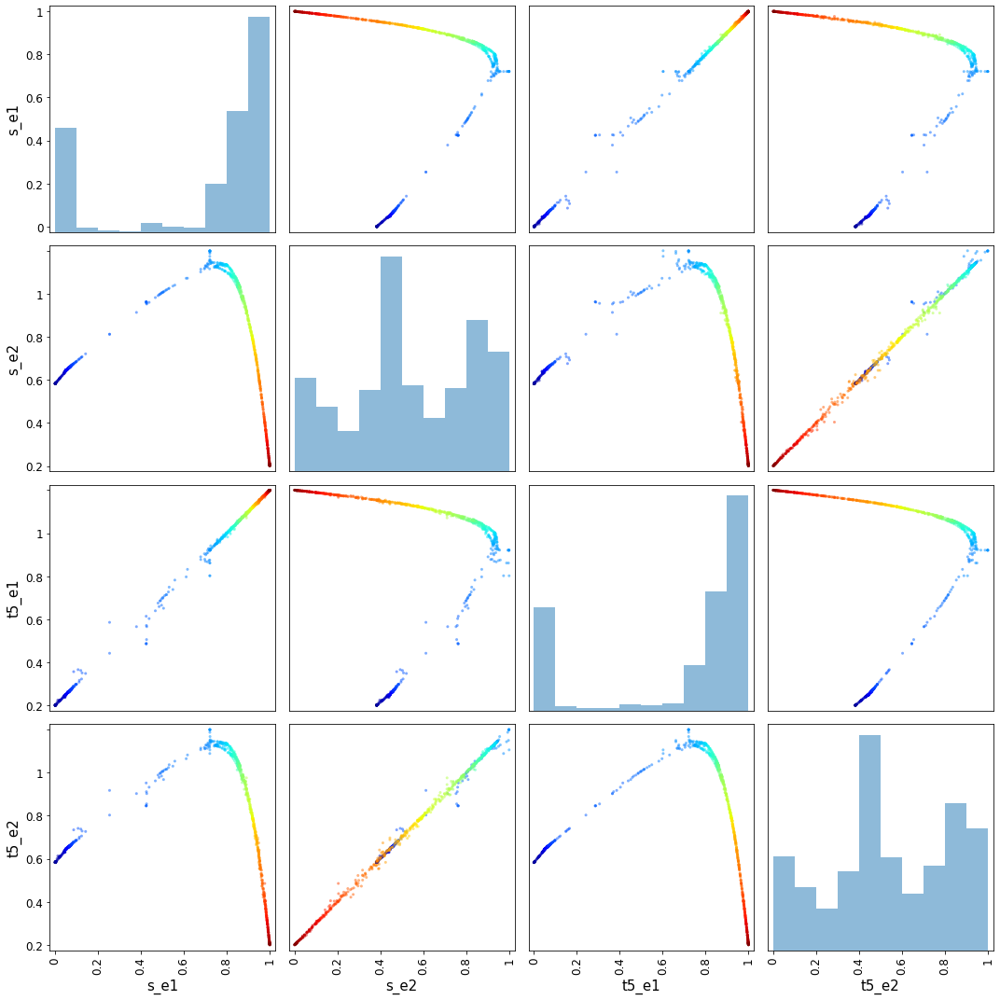

Neighborhood size: 10


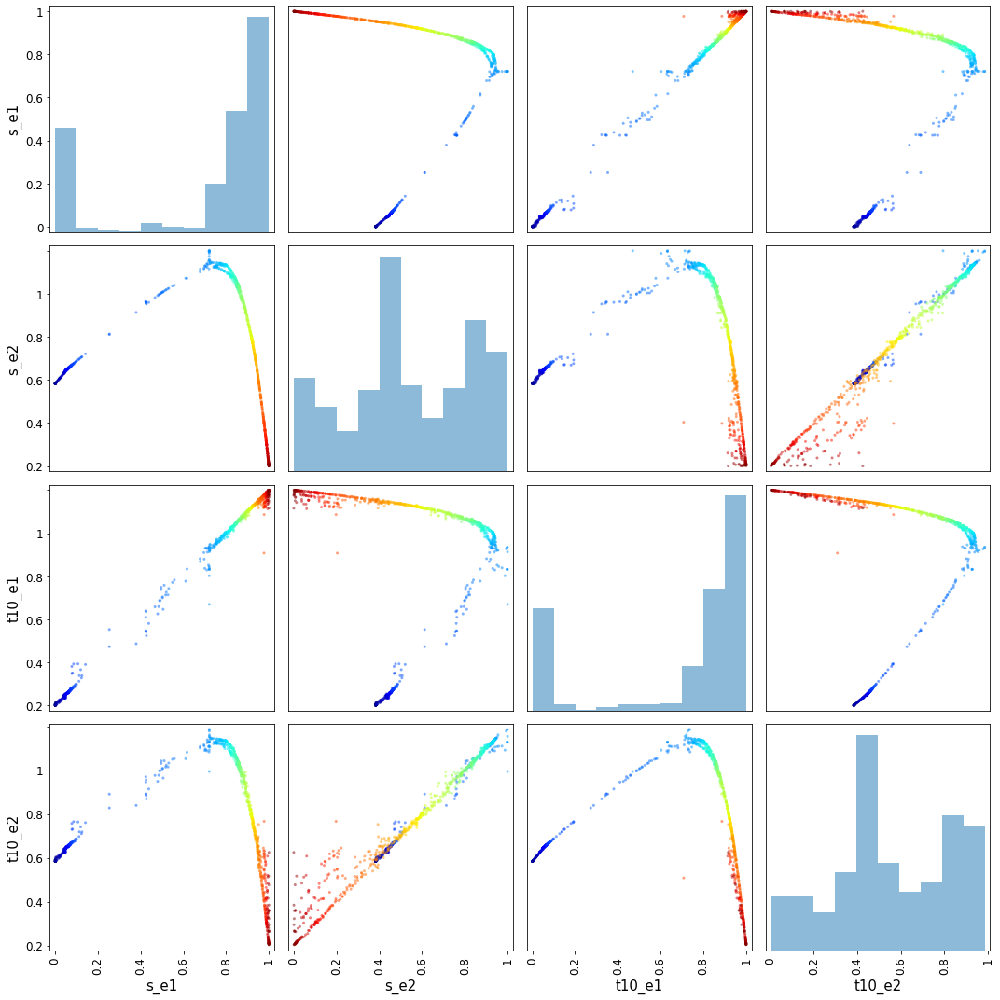

In [598]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='middletemporal', 
                  target_id='middletemporal', 
                  plot_neighborhood_sizes=[1, 5, 10])

### Source: Rostralmiddlefrontal, Target: Rostralmiddlefrontal

Souce shape: (1591, 4800)
Target shape: (1591, 4800)
Neighborhood size: 1


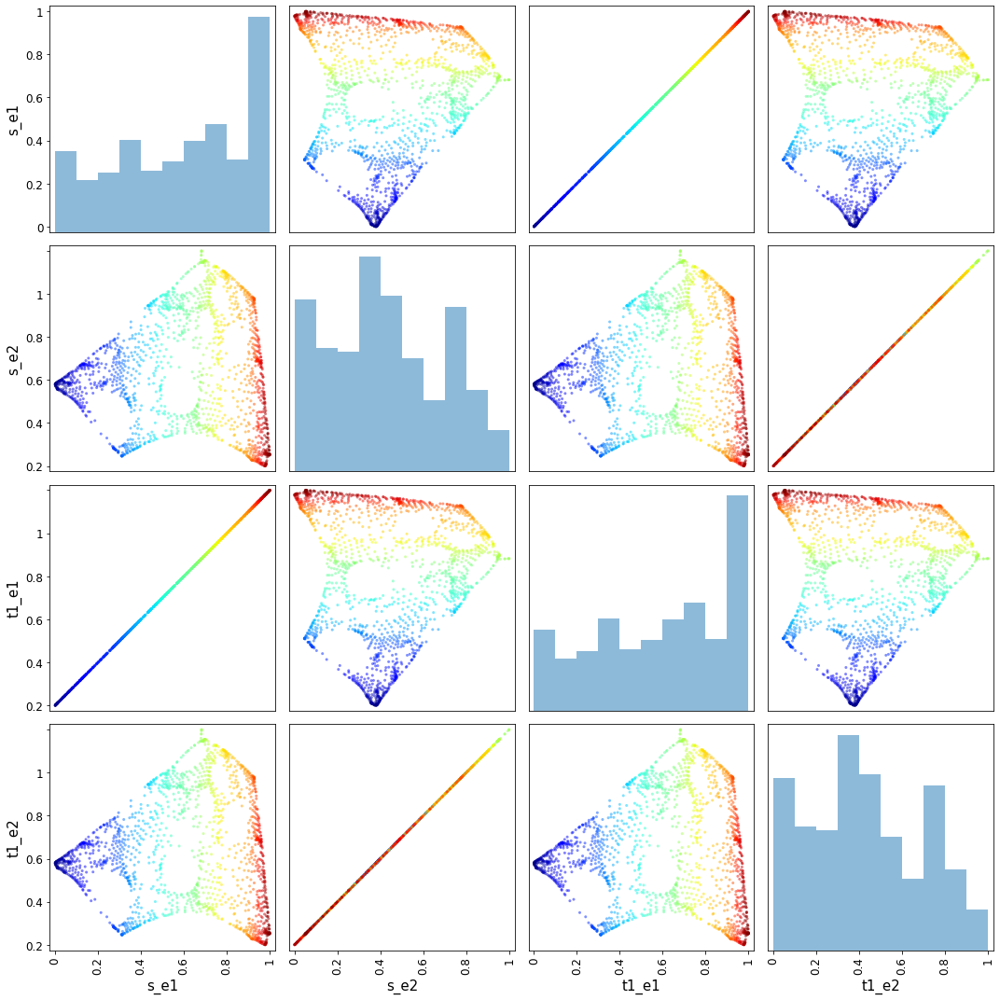

Neighborhood size: 5


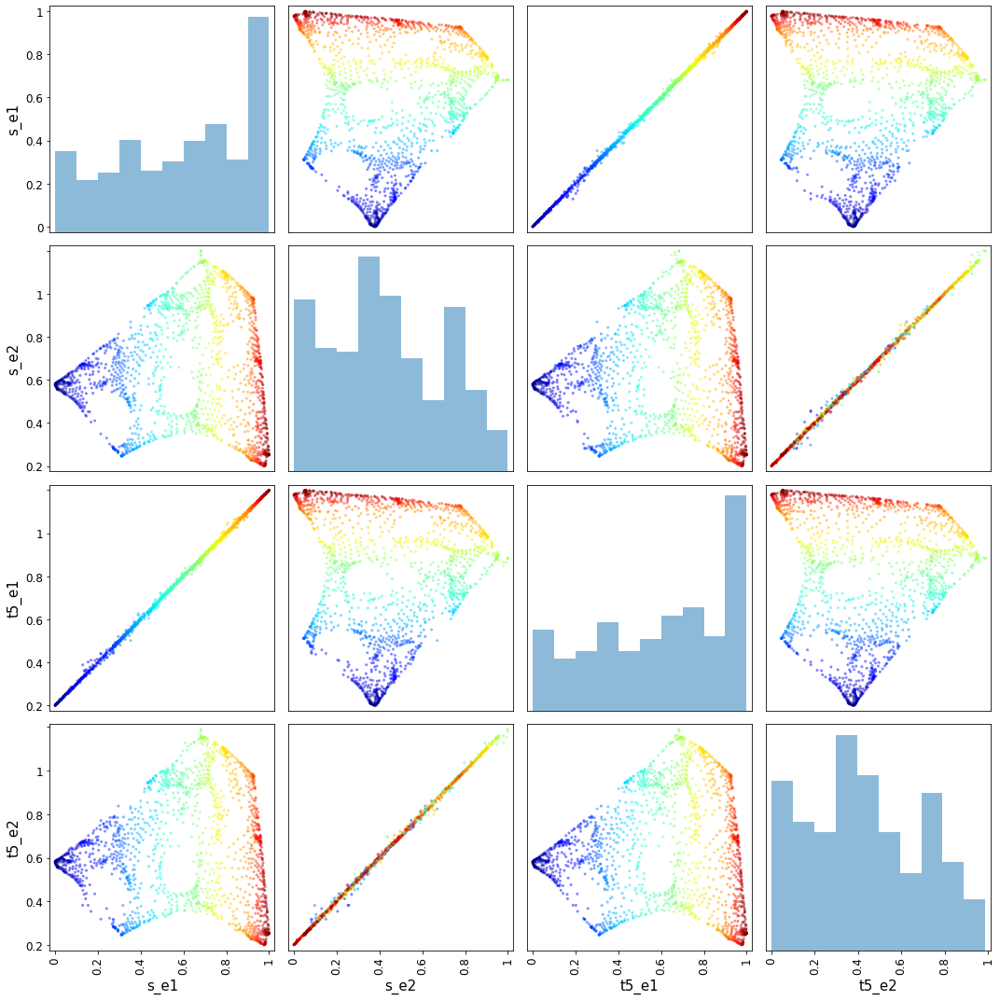

Neighborhood size: 10


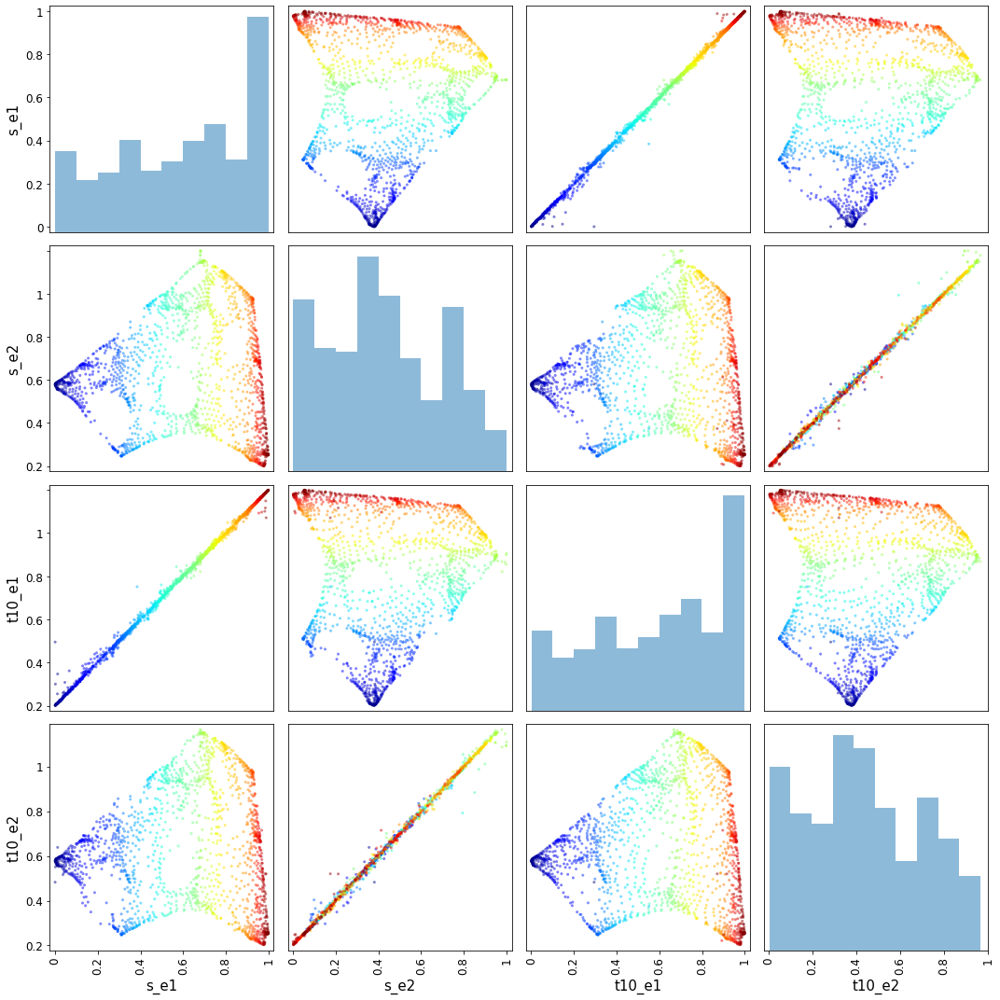

In [599]:
D = plot_pairwise(rest, regions, 
                  conn_dir='/Users/kristianeschenburg/Desktop/Connectopies/Desikan', 
                  out_dir='/Users/kristianeschenburg/Desktop',
                  subject_id='285345', 
                  source_id='rostralmiddlefrontal', 
                  target_id='rostralmiddlefrontal', 
                  plot_neighborhood_sizes=[1, 5, 10])